In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk membangun model LSTM
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_test, y_pred, dataset_name, n_steps):
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)  # Tambahkan argumen n_steps_out=1
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Membangun dan melatih model LSTM
        model = build_lstm_model((n_steps, X.shape[2]))
        model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

        # Memprediksi
        y_pred = model.predict(X_test, verbose=0)

        # Menghitung Mean Absolute Error (MAE)
        mae = mean_absolute_error(y_test, y_pred)

        # Menghitung R-squared (R2)
        r2 = r2_score(y_test, y_pred)

        # Menghitung BIAS
        bias = np.mean(y_pred - y_test)

        # Menyimpan hasil untuk timestep saat ini
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'MAE': mae,
            'R2': r2,
            'Bias': bias
        })

        # Visualisasi actual vs predicted
        plot_actual_vs_predicted(y_test, y_pred, name, n_steps)

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal
optimal_timestep = results_df.loc[results_df['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


7/7 [==============================] - 0s 3ms/step


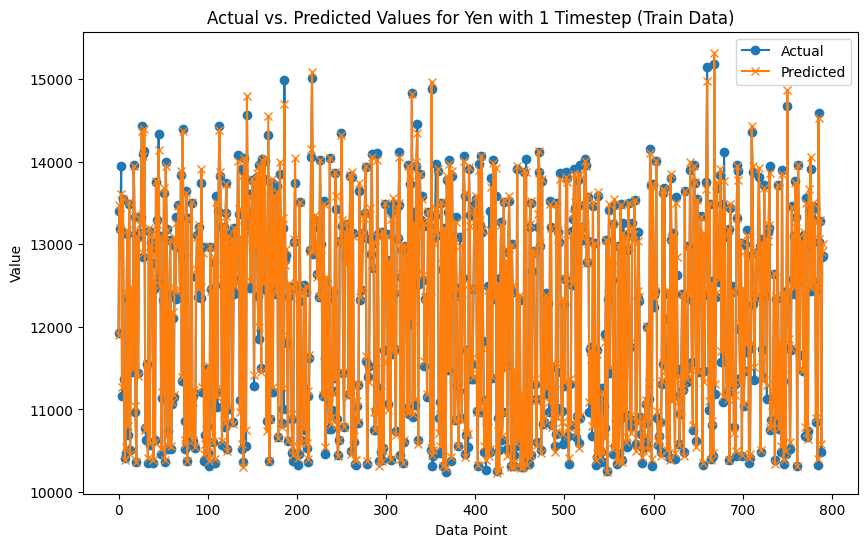

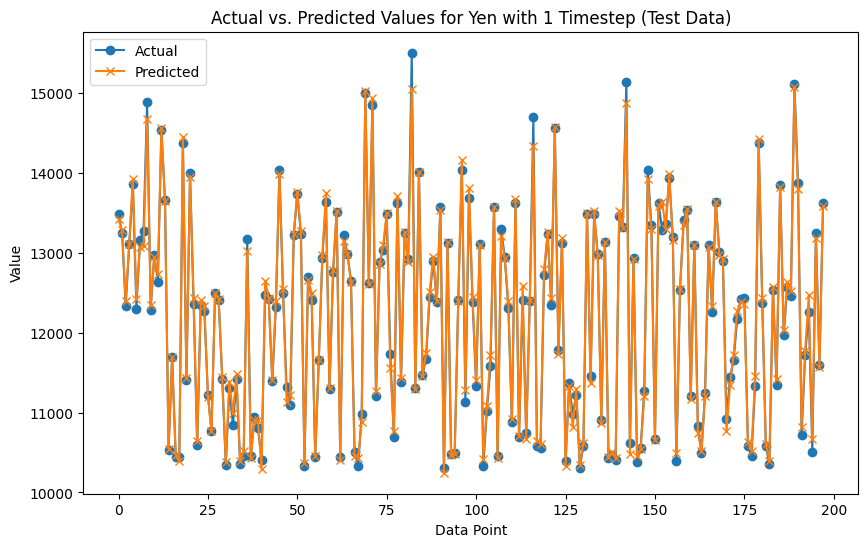

7/7 [==============================] - 0s 3ms/step


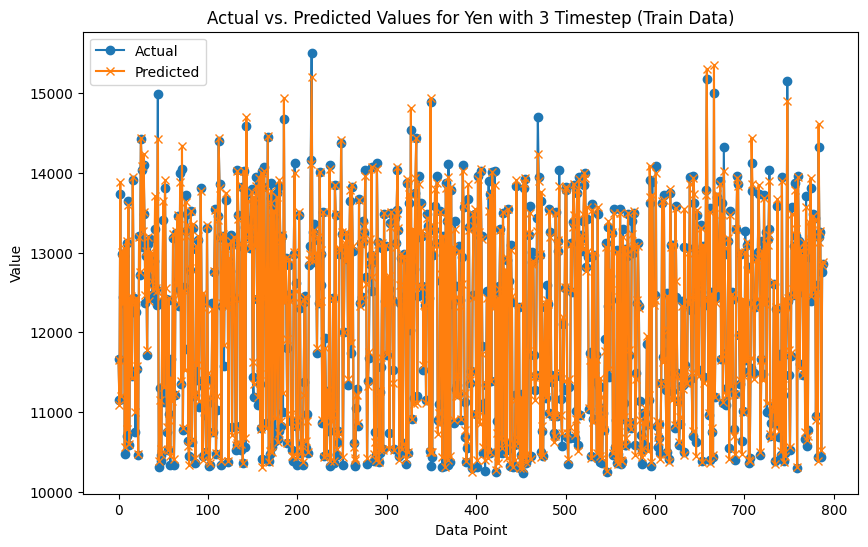

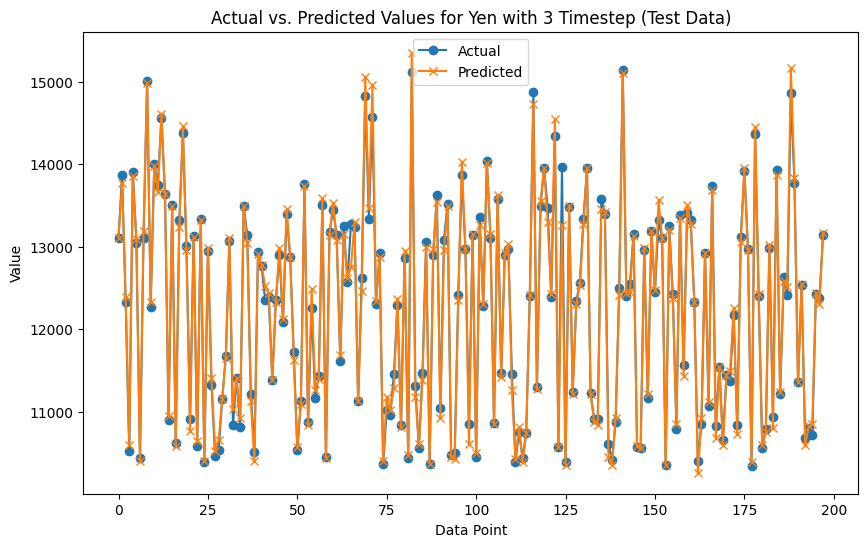

7/7 [==============================] - 0s 7ms/step


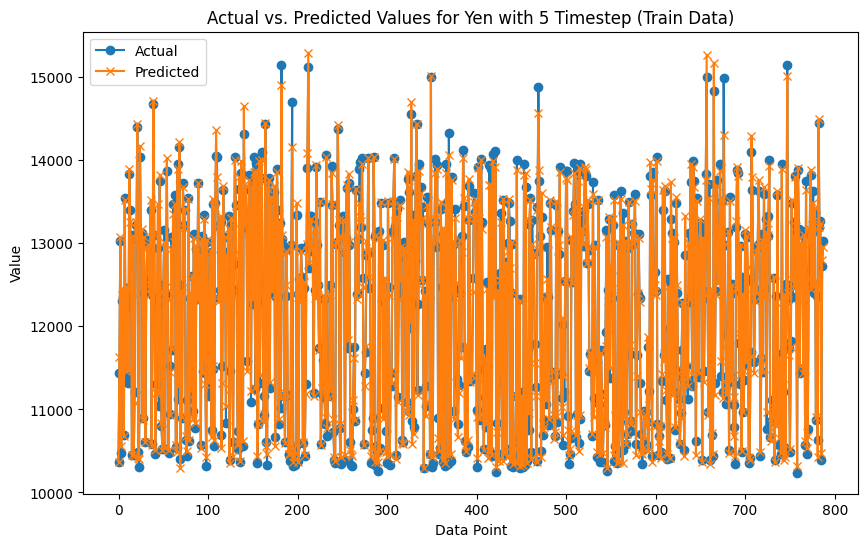

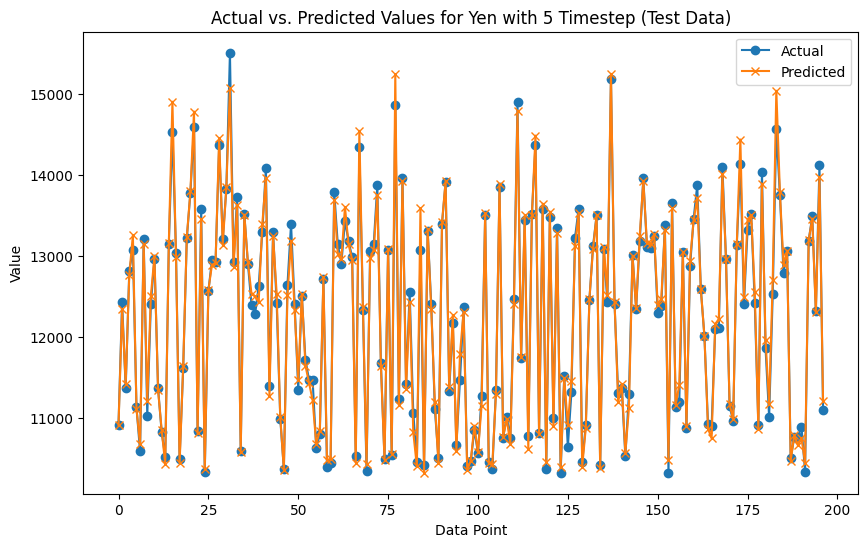

7/7 [==============================] - 0s 4ms/step


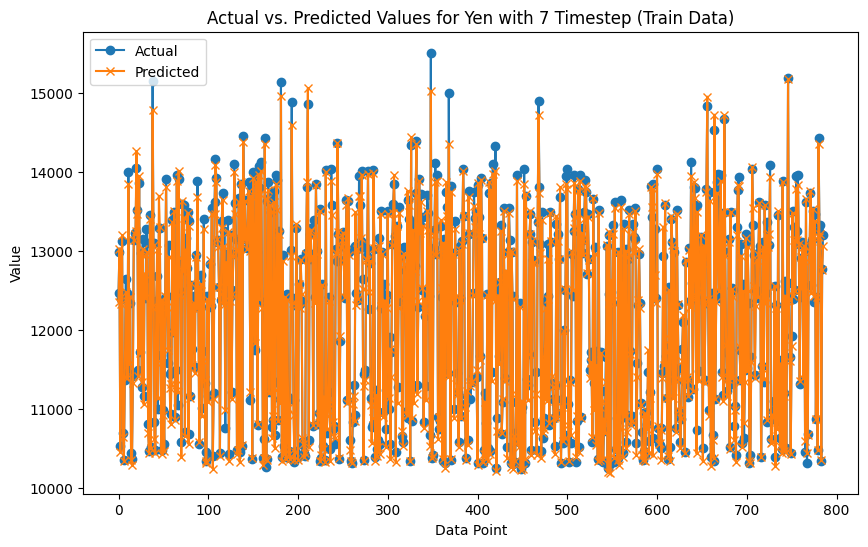

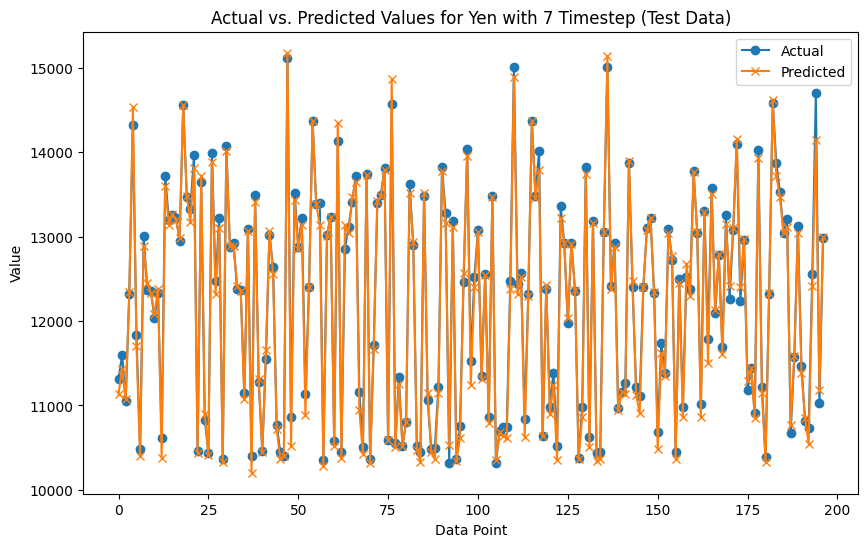

7/7 [==============================] - 0s 4ms/step


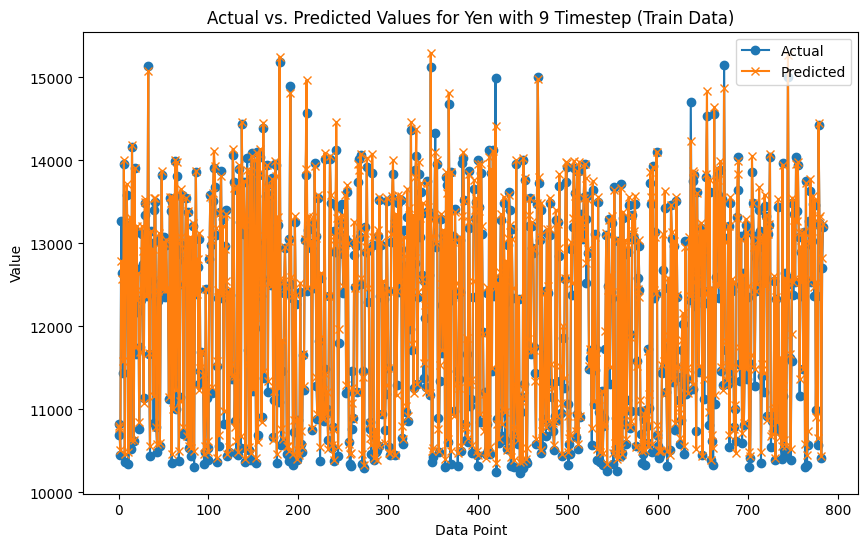

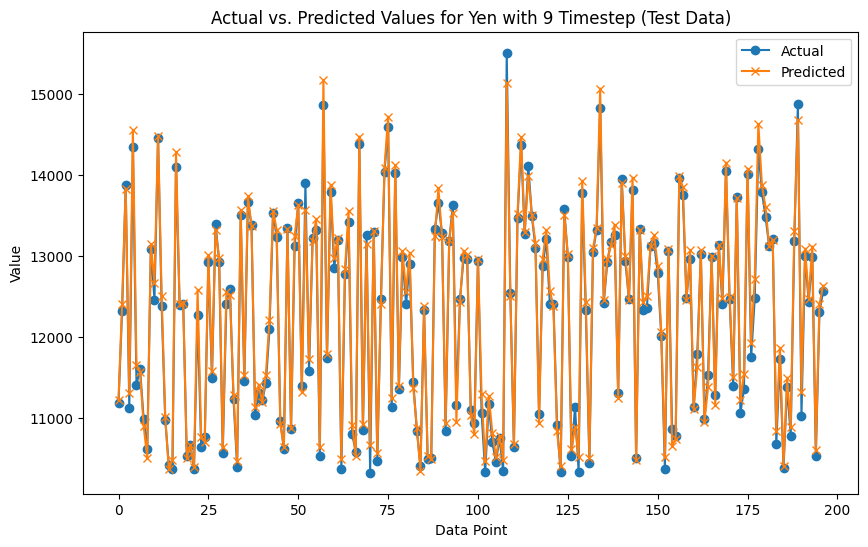

7/7 [==============================] - 0s 4ms/step


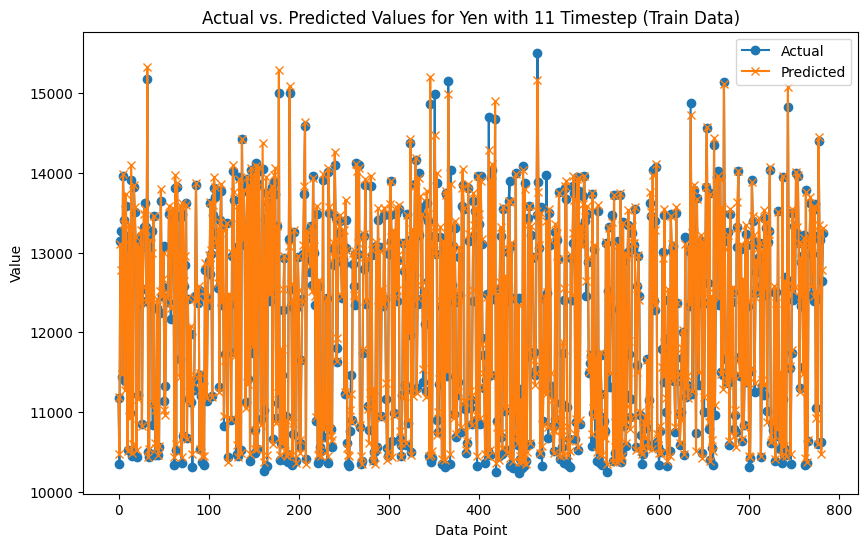

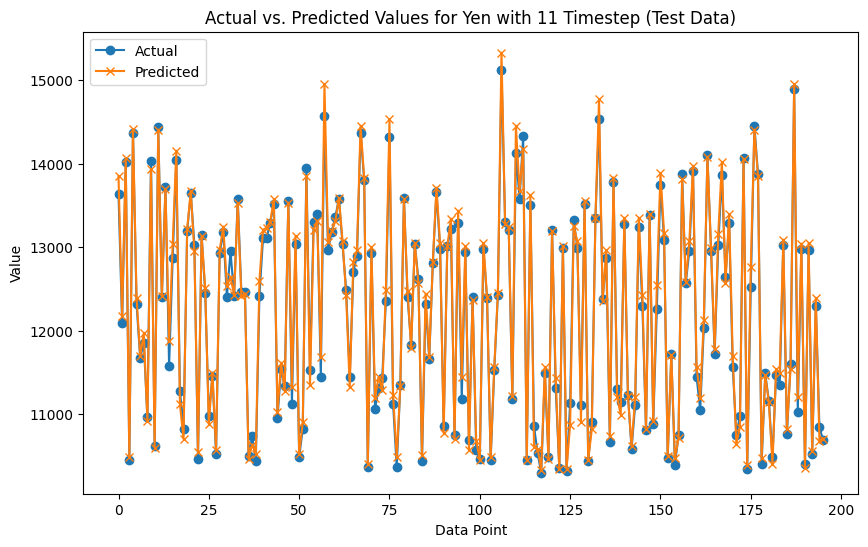

7/7 [==============================] - 0s 4ms/step


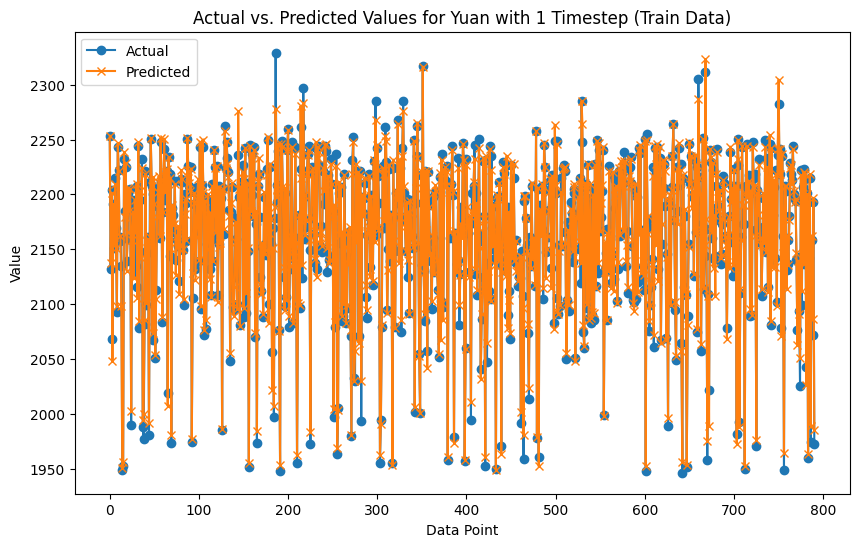

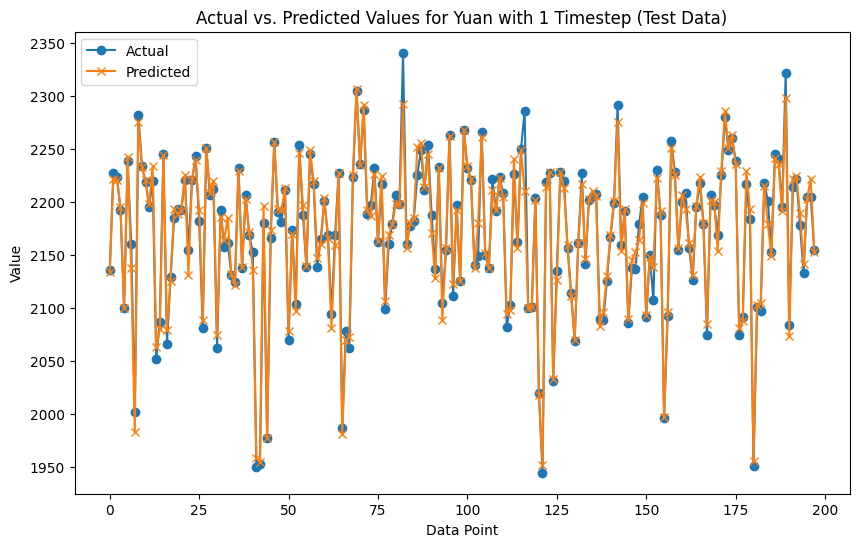

7/7 [==============================] - 0s 3ms/step


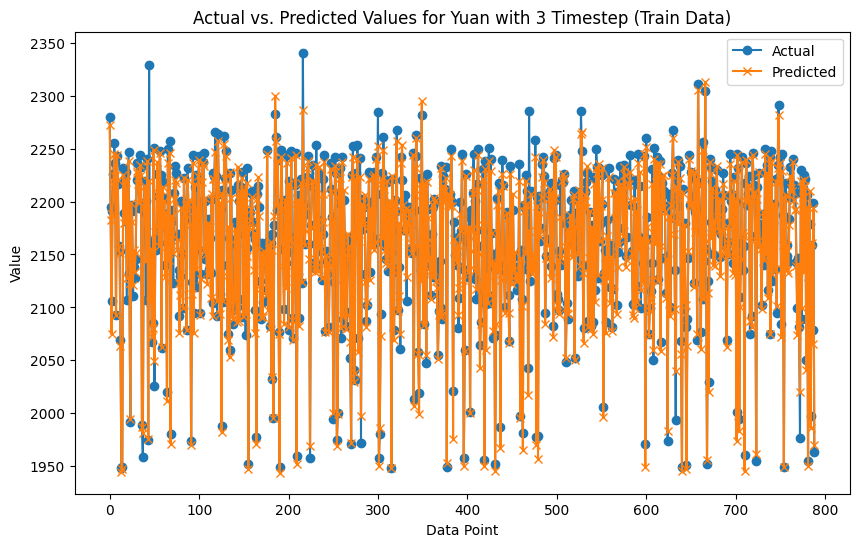

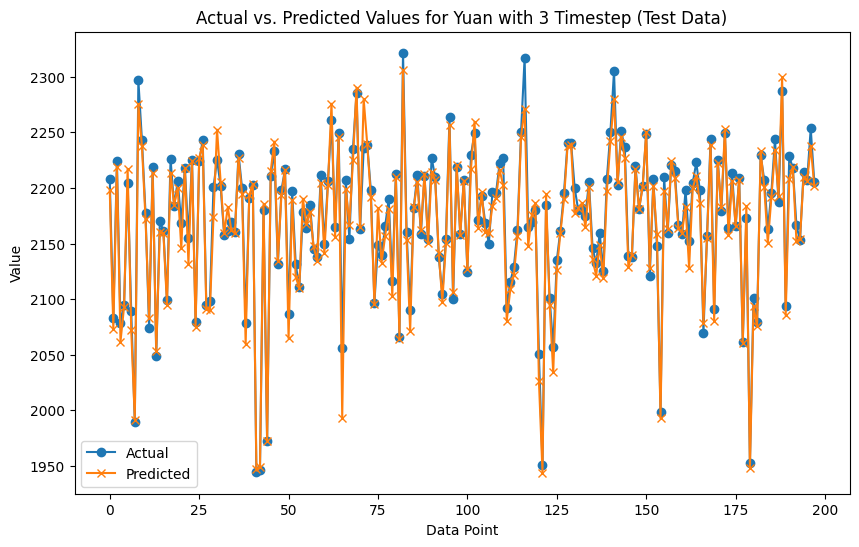

7/7 [==============================] - 0s 4ms/step


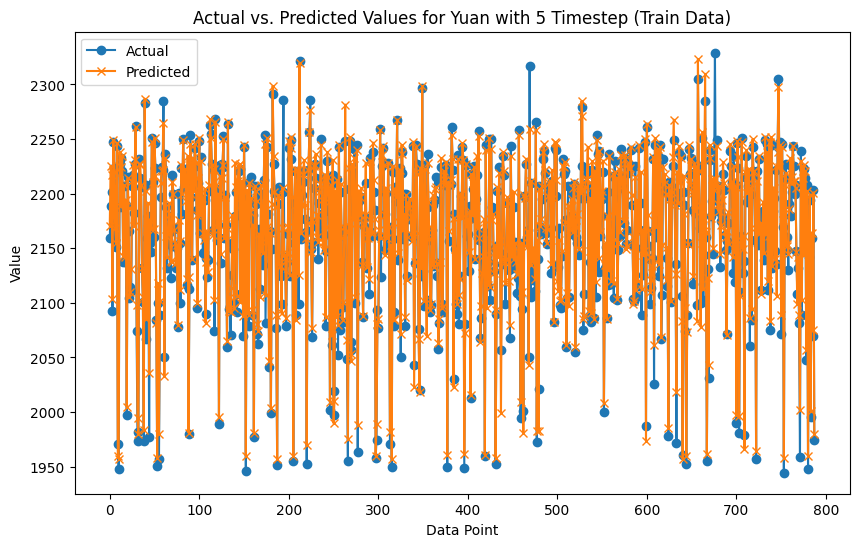

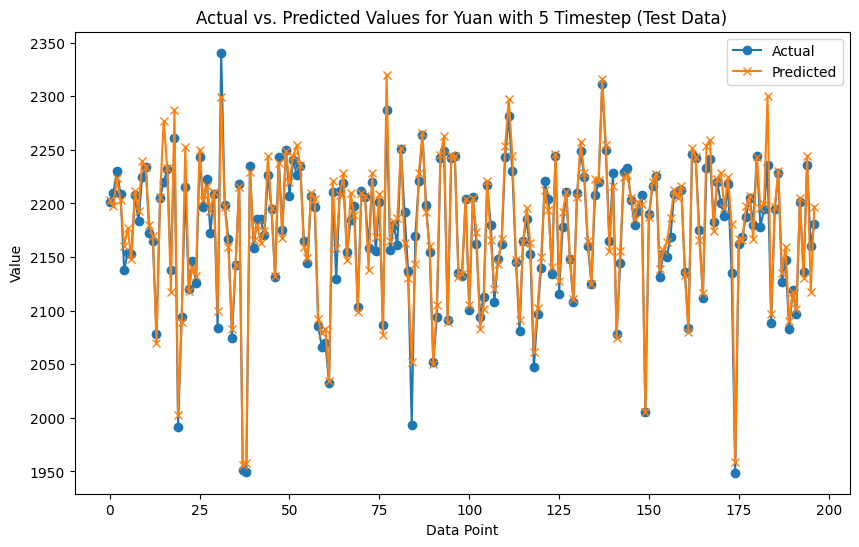

7/7 [==============================] - 0s 4ms/step


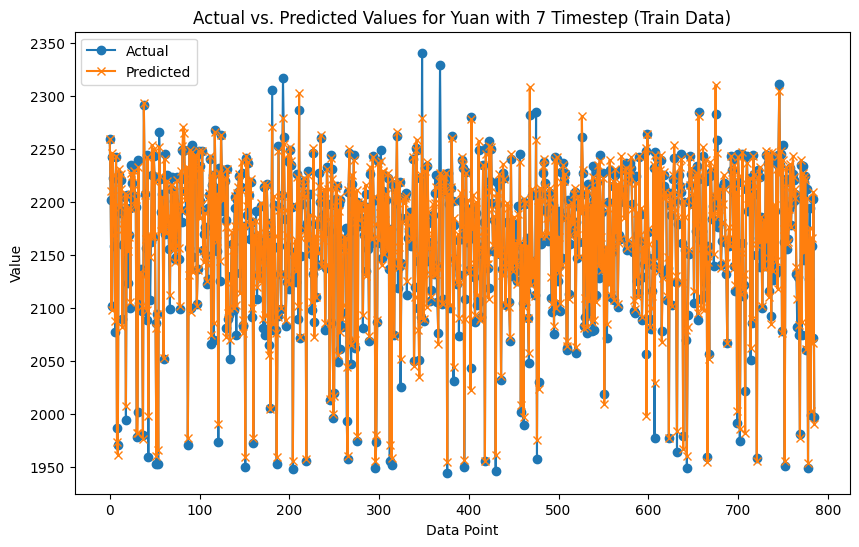

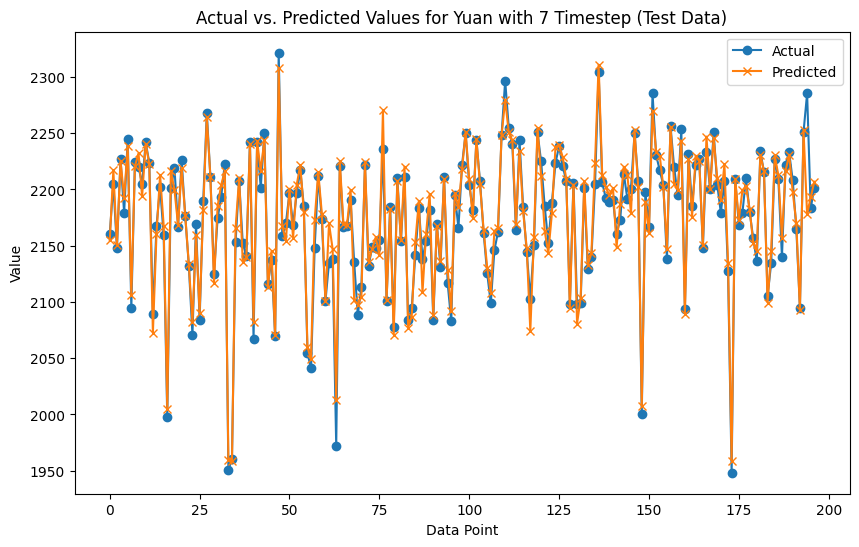

7/7 [==============================] - 0s 4ms/step


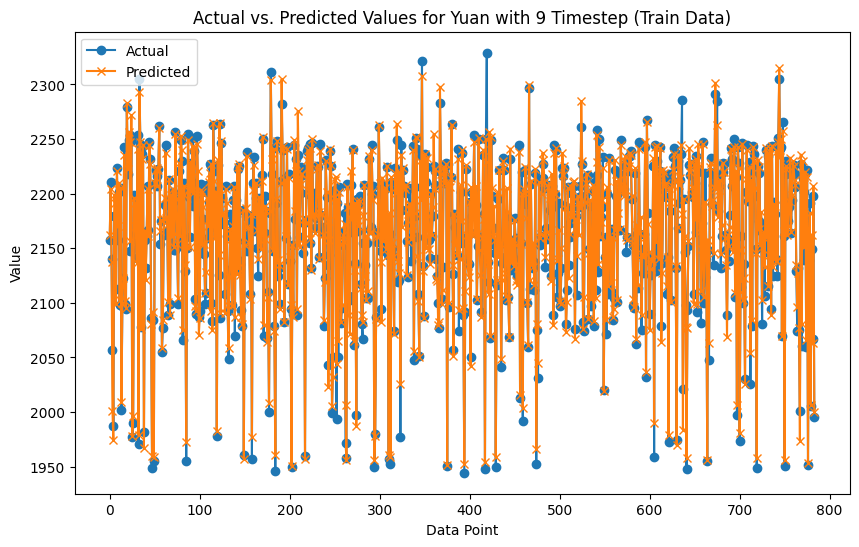

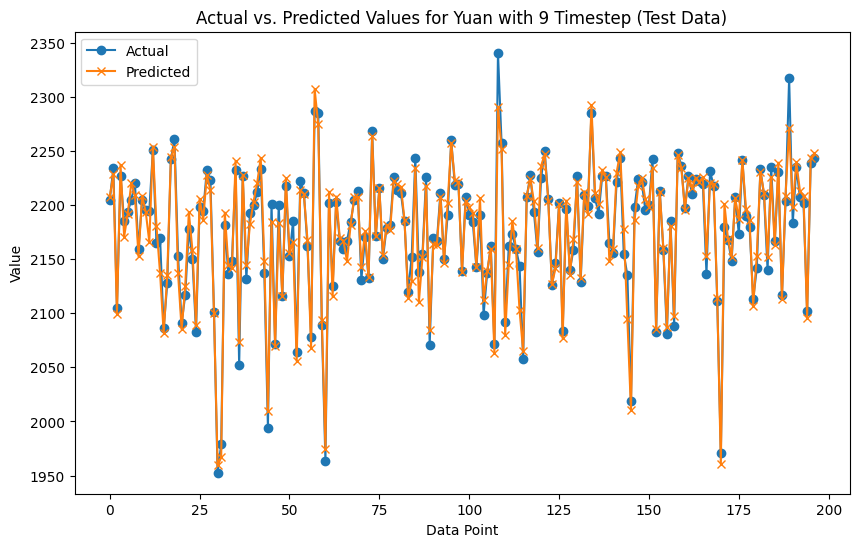

7/7 [==============================] - 0s 5ms/step


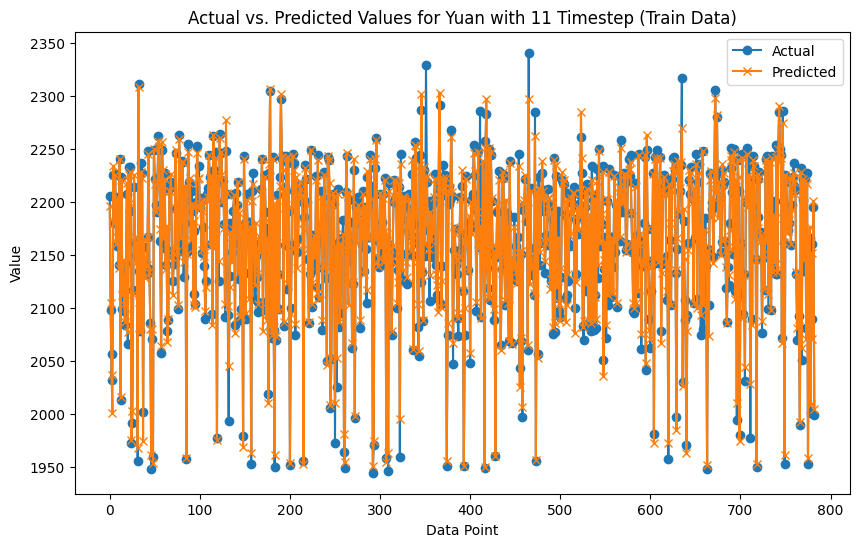

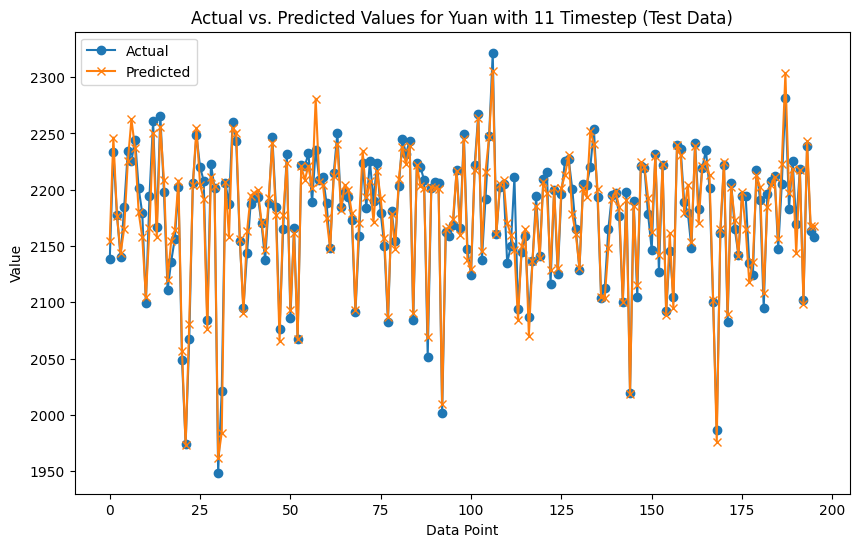

7/7 [==============================] - 0s 4ms/step


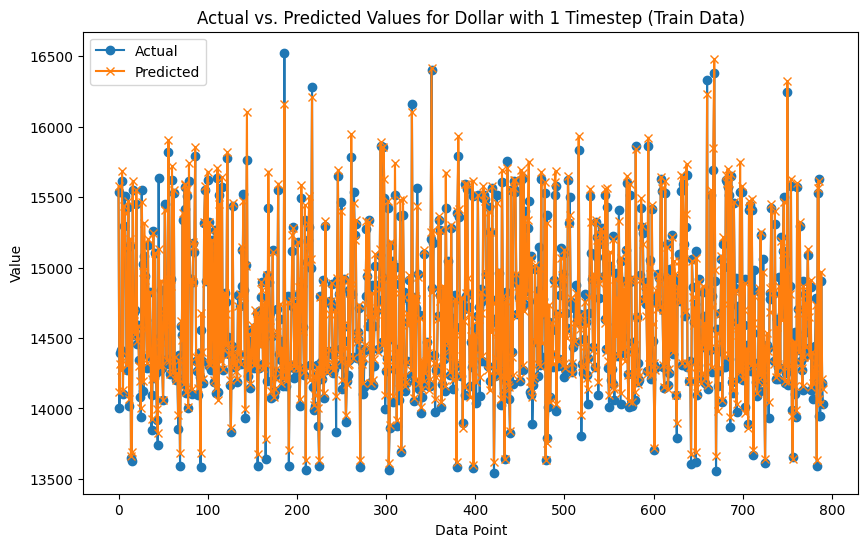

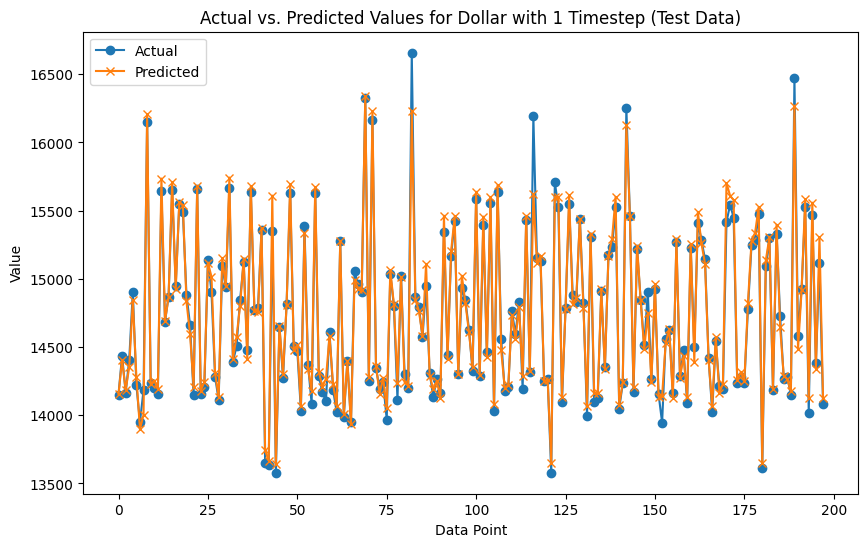

7/7 [==============================] - 0s 3ms/step


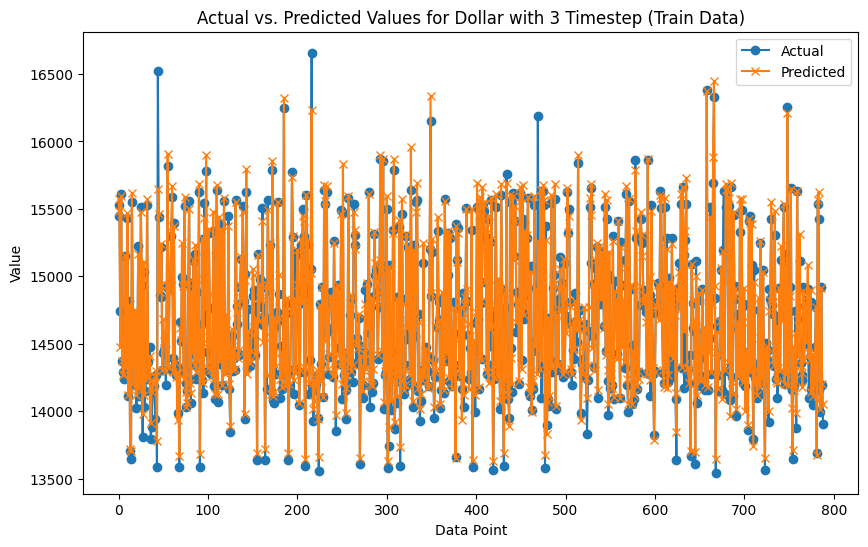

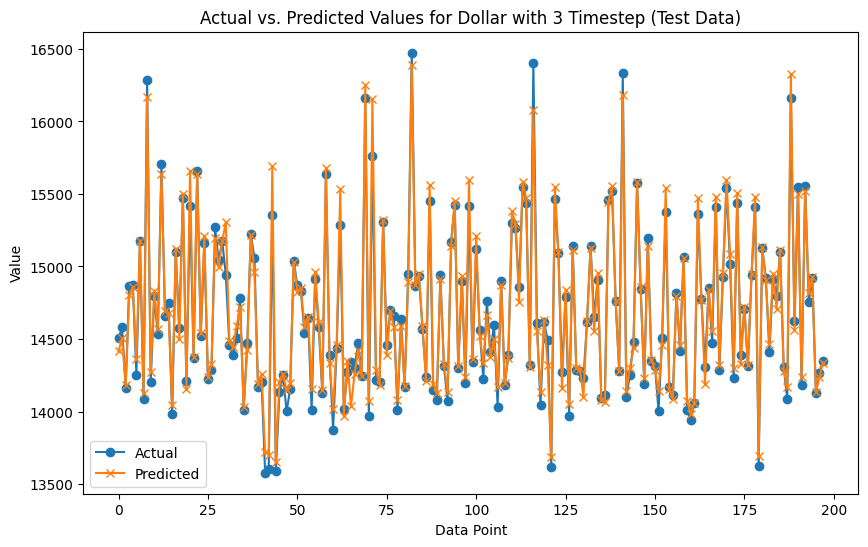

7/7 [==============================] - 0s 4ms/step


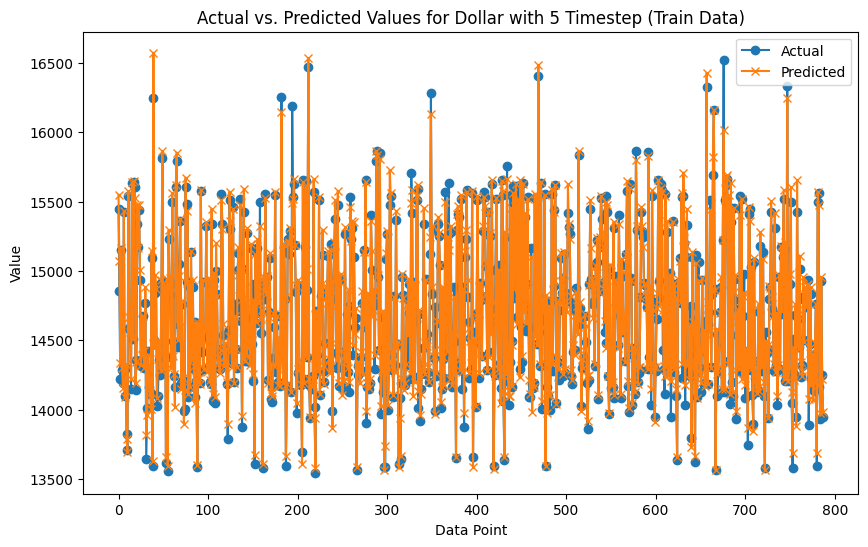

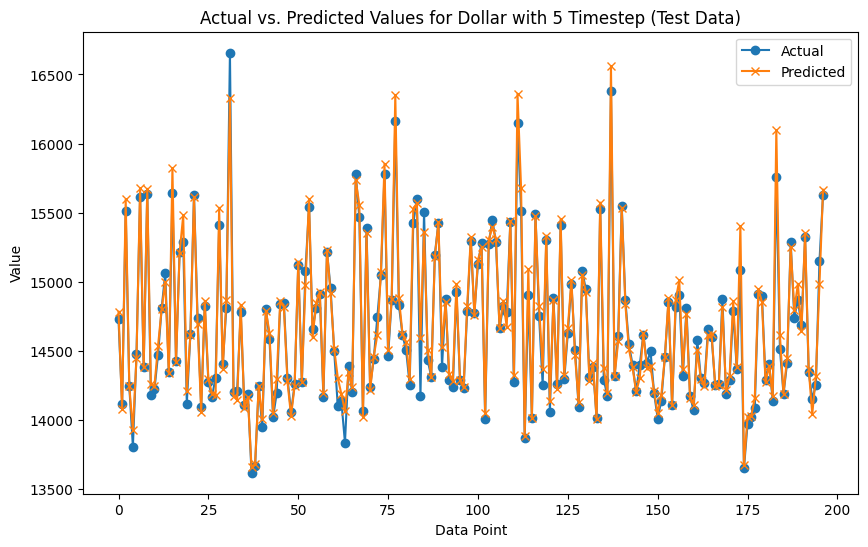

7/7 [==============================] - 0s 4ms/step


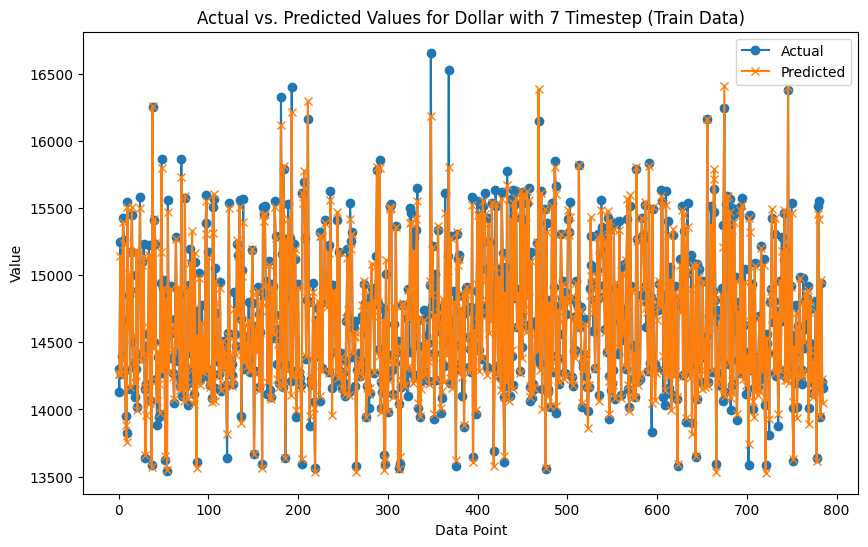

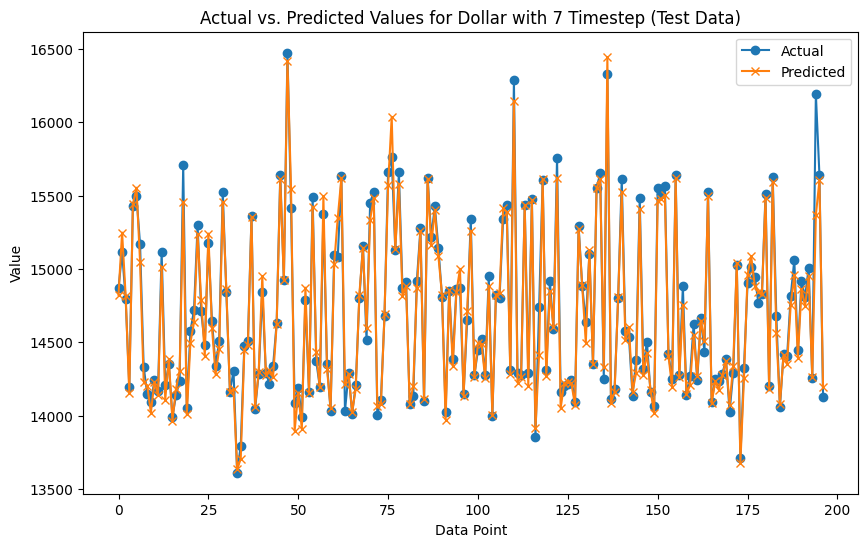

7/7 [==============================] - 0s 4ms/step


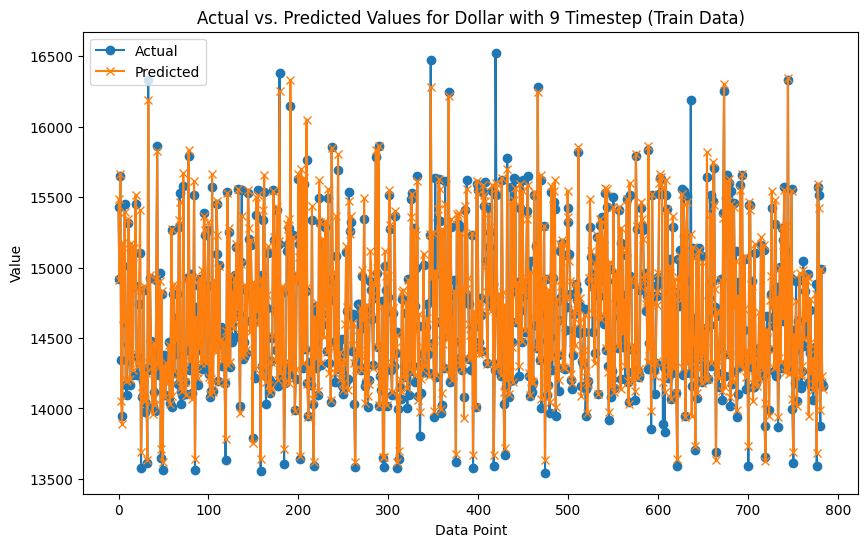

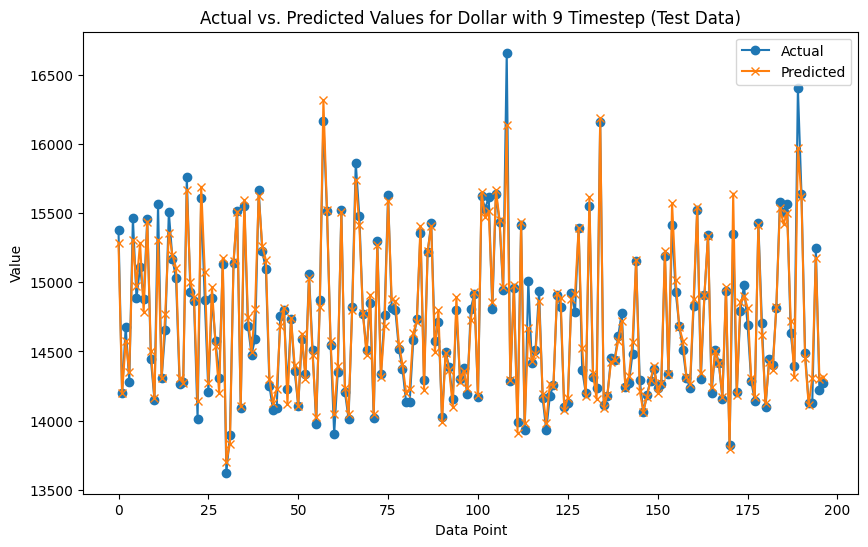

7/7 [==============================] - 0s 4ms/step


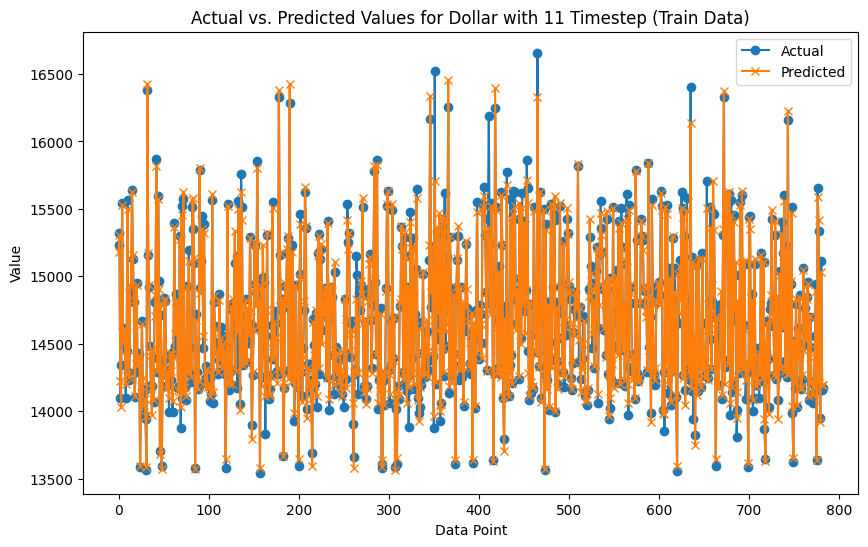

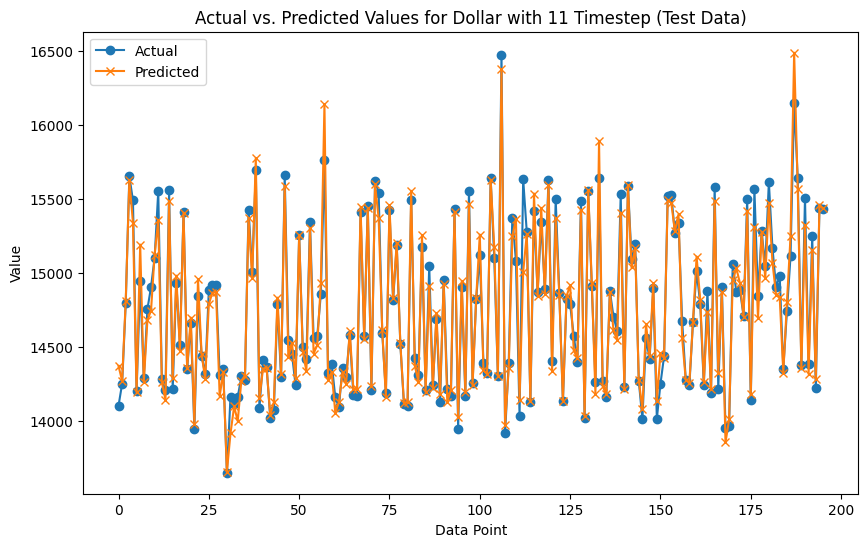

   Dataset  Timestep Data Type        MAE  R-square       Bias      MAPE
0      Yen         1     Train  58.450129  0.995796  13.073745  0.483085
1      Yen         1      Test  61.792976  0.995501   8.746507  0.505798
2      Yen         3     Train  70.364200  0.993865   6.109726  0.578271
3      Yen         3      Test  70.590123  0.993016  -1.916424  0.571641
4      Yen         5     Train  79.607338  0.992171  -8.526406  0.653034
5      Yen         5      Test  81.432372  0.991870   9.758534  0.659385
6      Yen         7     Train  82.138381  0.991949 -45.088492  0.674825
7      Yen         7      Test  80.659157  0.992478 -41.673547  0.669787
8      Yen         9     Train  91.702803  0.990874  54.859770  0.763298
9      Yen         9      Test  92.993365  0.991626  47.994206  0.765468
10     Yen        11     Train  83.606727  0.992204  36.576656  0.690349
11     Yen        11      Test  83.434115  0.992731  33.801476  0.687119
12    Yuan         1     Train   6.082779  0.985575

In [ ]:
!pip install tensorflow numpy pandas scikit-learn matplotlib

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Definisi model LSTM
        model = Sequential()
        model.add(LSTM(50, activation='relu', input_shape=(n_steps, X.shape[2])))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')

        # Training model
        model.fit(X_train, y_train, epochs=50, verbose=0)

        # Prediksi
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


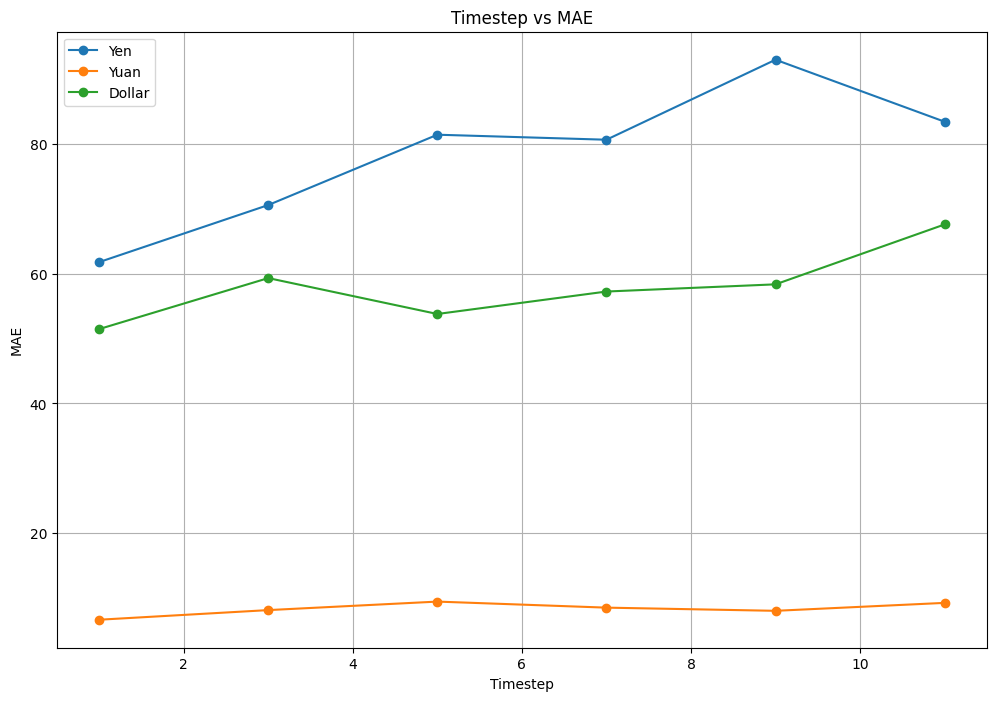

In [ ]:
# Visualisasi Timestep terhadap MAE untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    datasets = results_df['Dataset'].unique()
    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


7/7 [==============================] - 0s 3ms/step


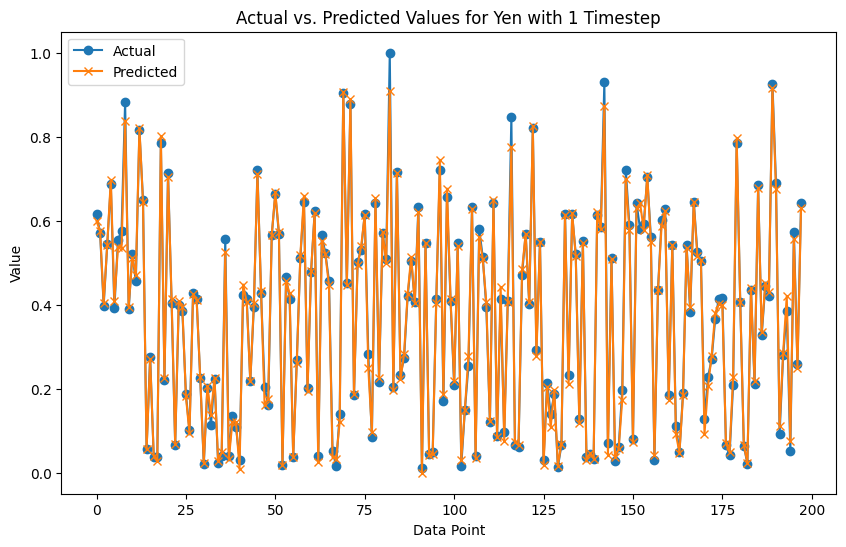

7/7 [==============================] - 0s 3ms/step


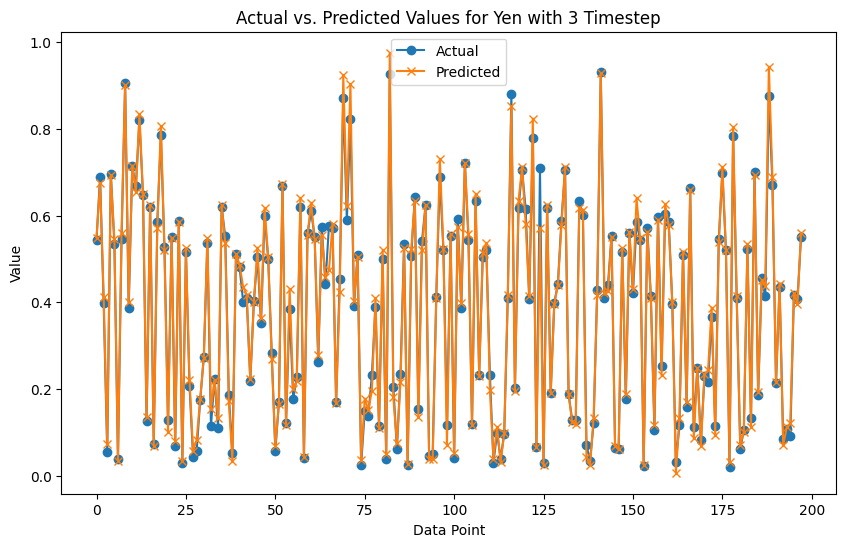

7/7 [==============================] - 0s 6ms/step


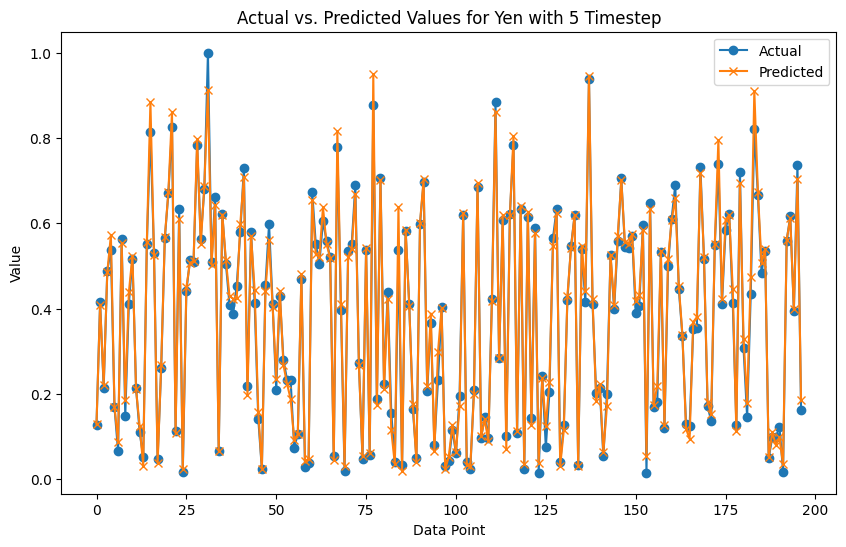

7/7 [==============================] - 0s 4ms/step


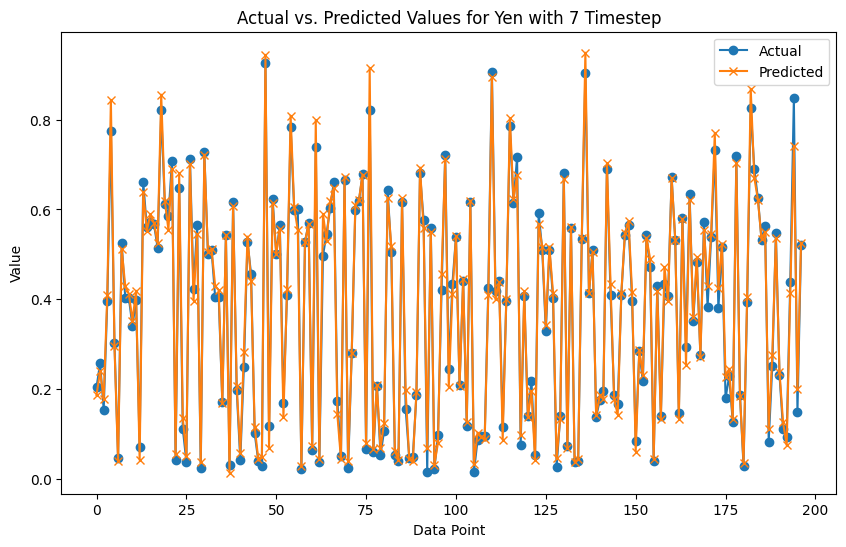

7/7 [==============================] - 0s 4ms/step


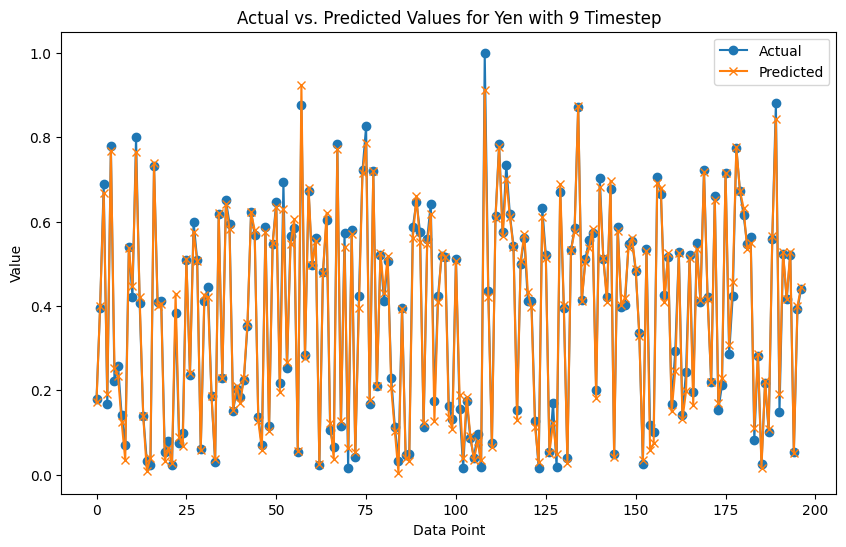

7/7 [==============================] - 0s 4ms/step


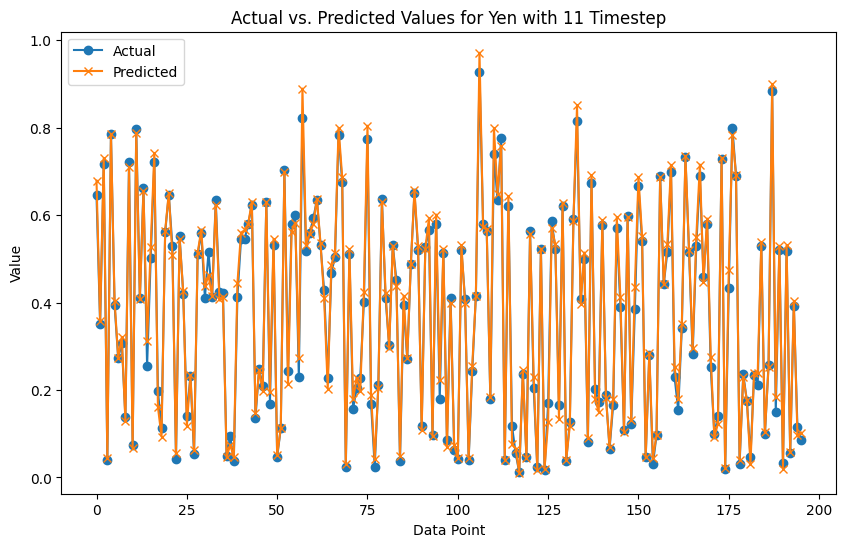

7/7 [==============================] - 0s 3ms/step


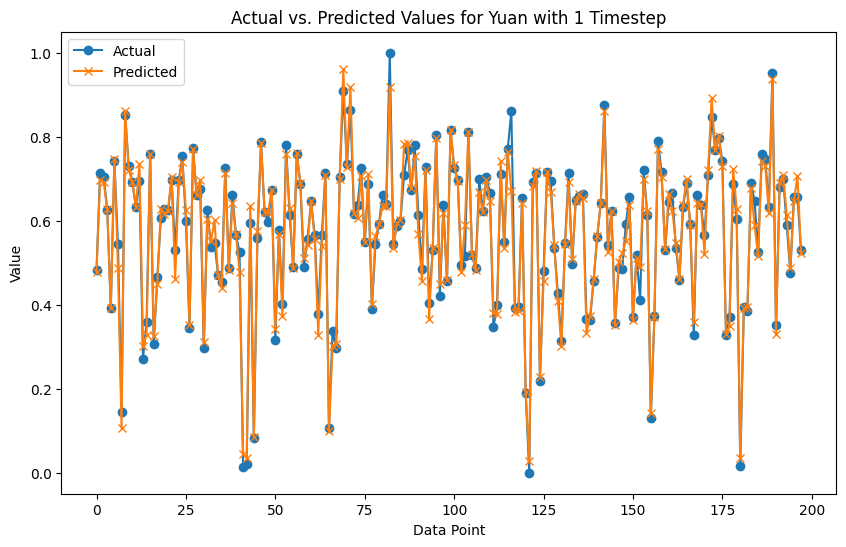

7/7 [==============================] - 0s 3ms/step


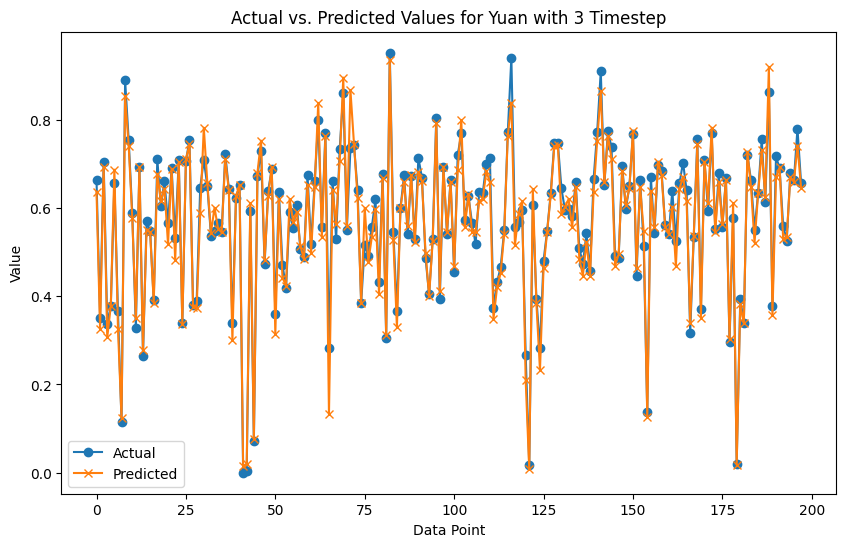

7/7 [==============================] - 0s 4ms/step


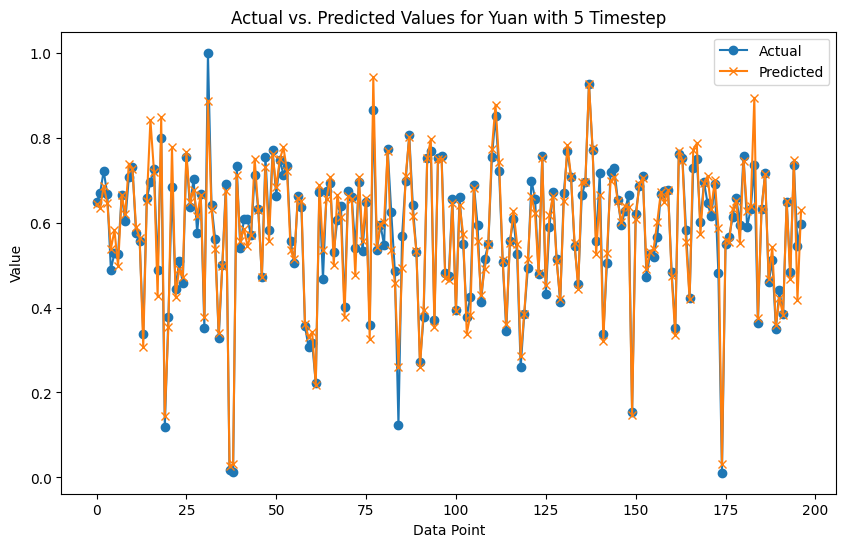

7/7 [==============================] - 0s 7ms/step


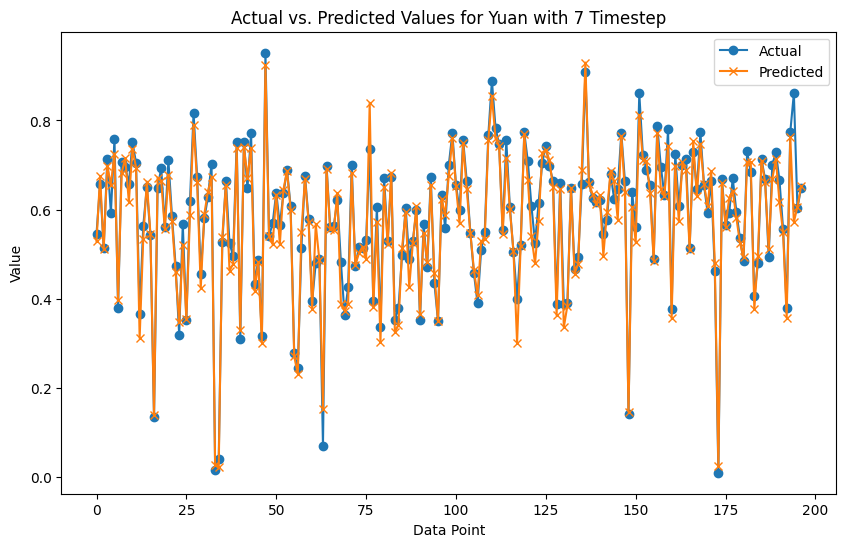

7/7 [==============================] - 0s 4ms/step


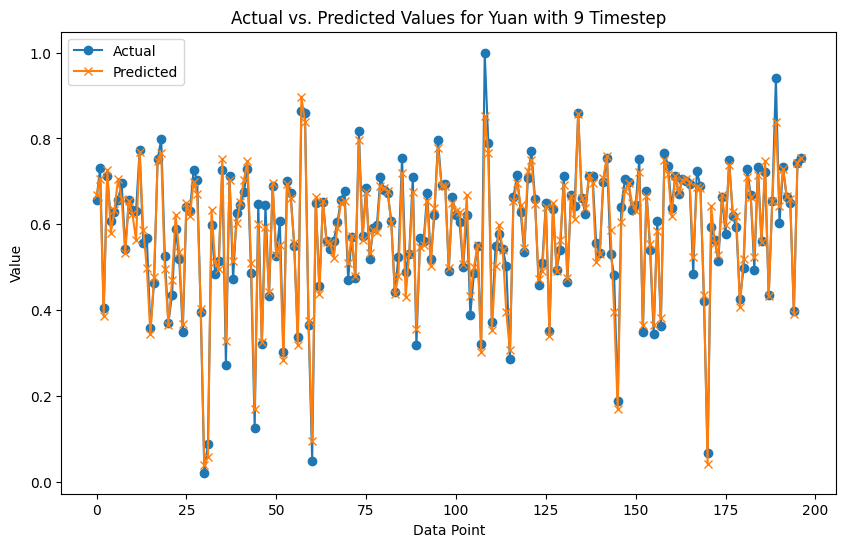

7/7 [==============================] - 0s 5ms/step


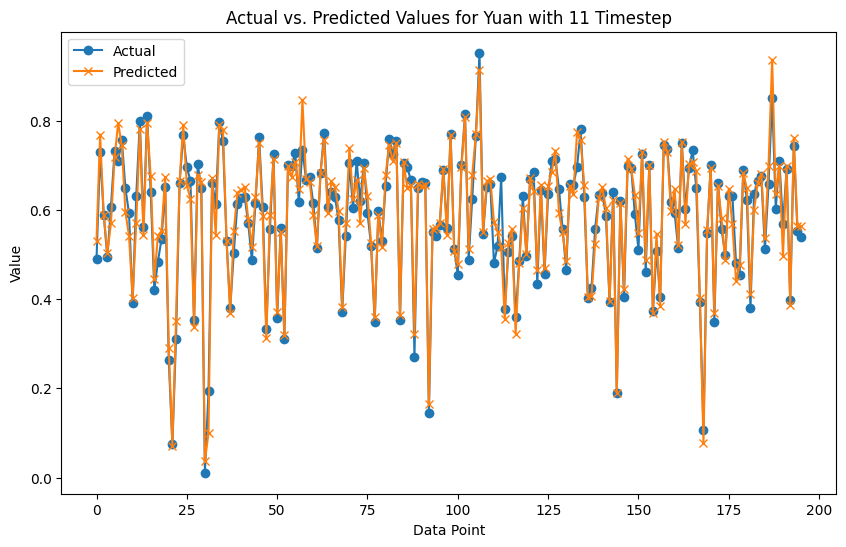

7/7 [==============================] - 0s 3ms/step


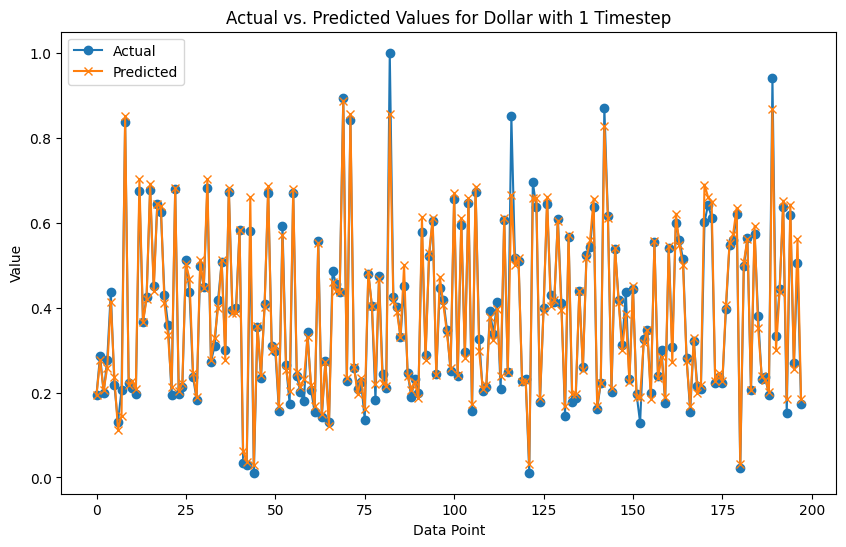

7/7 [==============================] - 0s 3ms/step


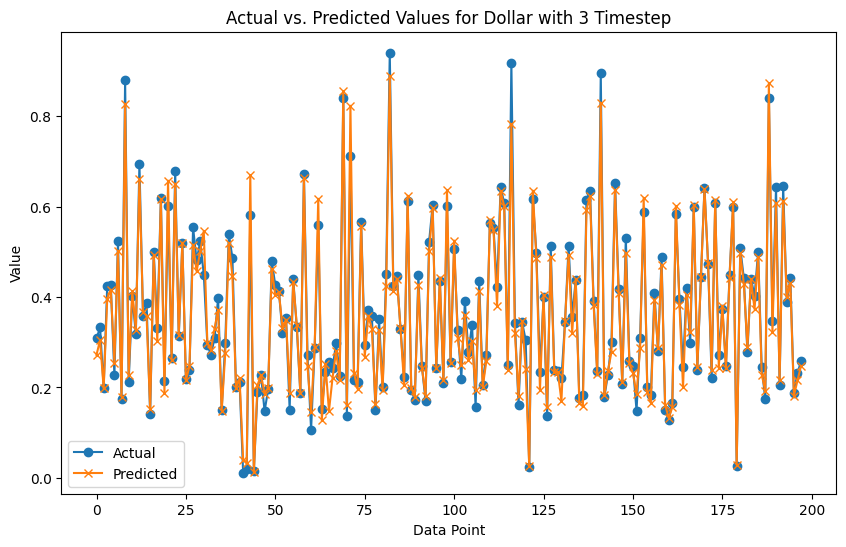

7/7 [==============================] - 0s 4ms/step


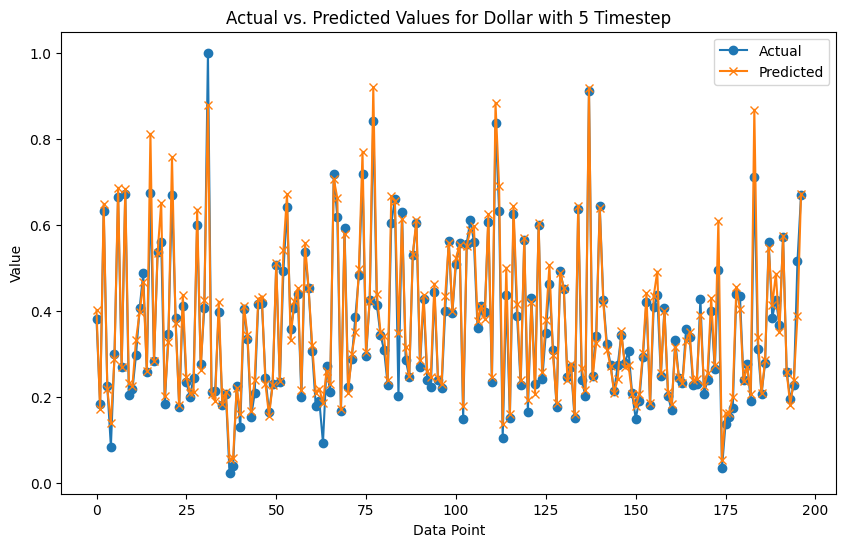

7/7 [==============================] - 0s 5ms/step


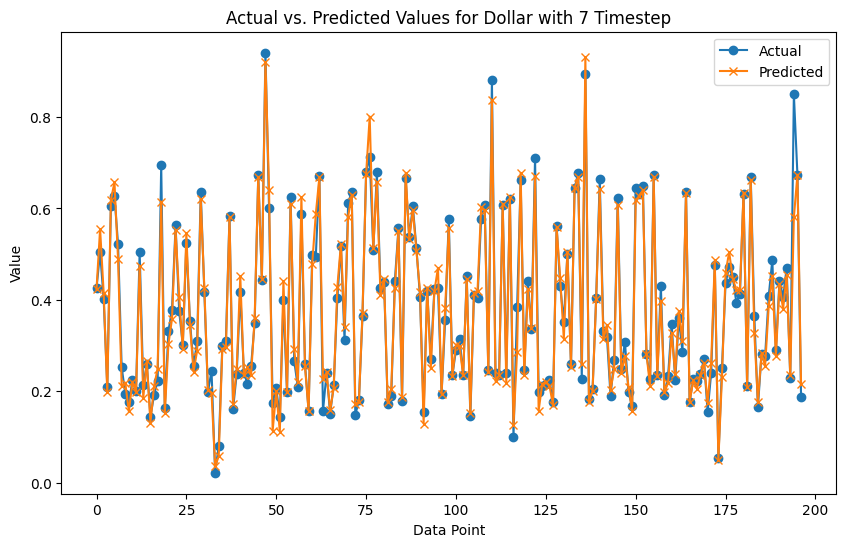

7/7 [==============================] - 0s 4ms/step


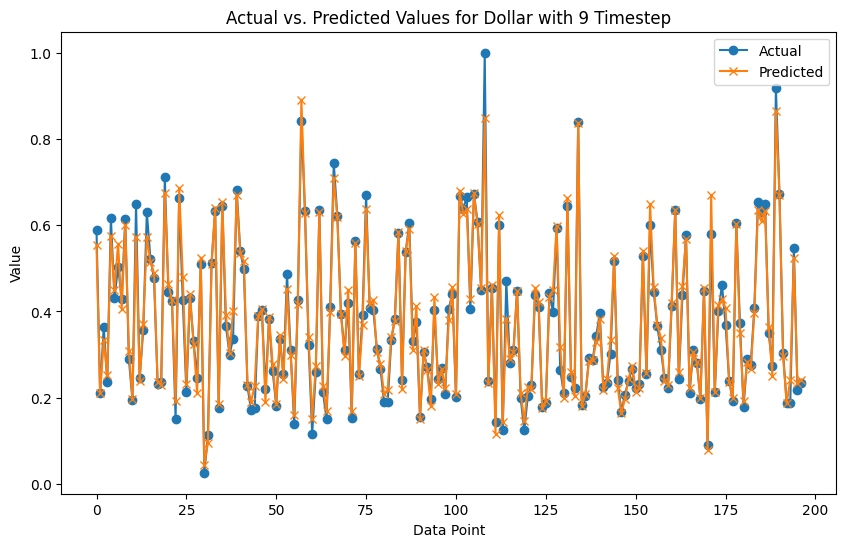

7/7 [==============================] - 0s 4ms/step


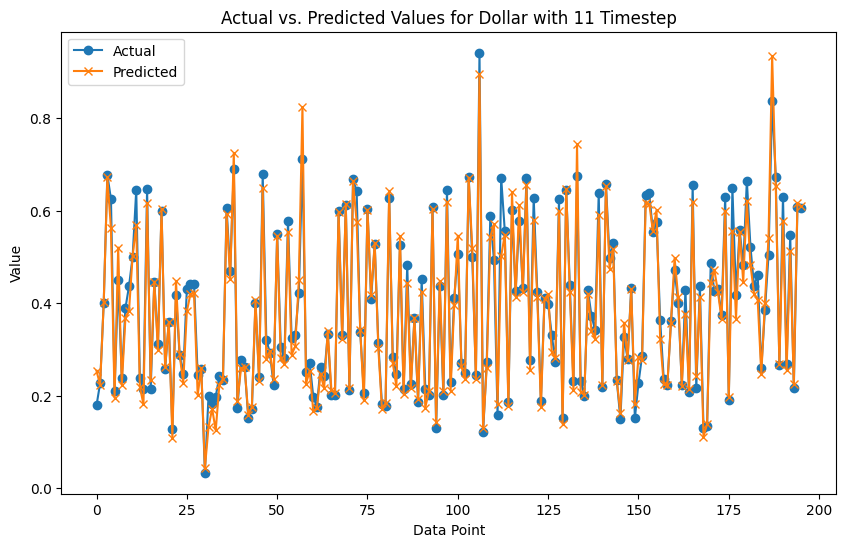

Train Results:
   Dataset  Timestep       MAE
0      Yen         1  0.010534
1      Yen         3  0.014313
2      Yen         5  0.015195
3      Yen         7  0.016137
4      Yen         9  0.014410
5      Yen        11  0.014463
6     Yuan         1  0.016168
7     Yuan         3  0.020970
8     Yuan         5  0.021613
9     Yuan         7  0.020382
10    Yuan         9  0.021181
11    Yuan        11  0.019640
12  Dollar         1  0.015618
13  Dollar         3  0.019253
14  Dollar         5  0.021897
15  Dollar         7  0.017199
16  Dollar         9  0.018576
17  Dollar        11  0.018008

Test Results:
   Dataset  Timestep       MAE
0      Yen         1  0.011240
1      Yen         3  0.014349
2      Yen         5  0.015767
3      Yen         7  0.016289
4      Yen         9  0.014768
5      Yen        11  0.013959
6     Yuan         1  0.017617
7     Yuan         3  0.019757
8     Yuan         5  0.023099
9     Yuan         7  0.022325
10    Yuan         9  0.020228
11    Yua

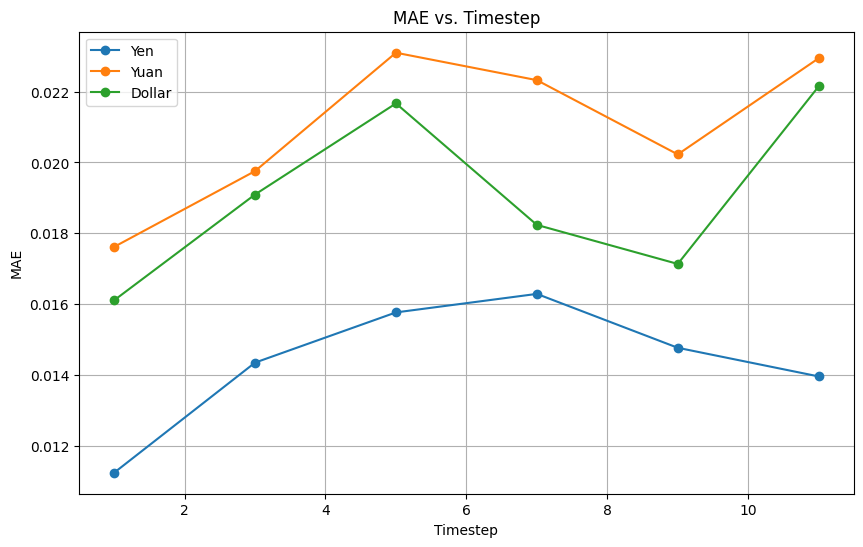

In [ ]:
!pip install tensorflow numpy pandas scikit-learn matplotlib

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_test, y_pred, dataset_name, n_steps):
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Fungsi untuk visualisasi time step dengan metrik tertentu
def plot_metric_vs_timestep(results_df, metric_name):
    plt.figure(figsize=(10, 6))
    for dataset_name in results_df['Dataset'].unique():
        dataset_results = results_df[results_df['Dataset'] == dataset_name]
        plt.plot(dataset_results['Timestep'], dataset_results[metric_name], marker='o', label=dataset_name)
    plt.title(f'{metric_name} vs. Timestep')
    plt.xlabel('Timestep')
    plt.ylabel(metric_name)
    plt.legend()
    plt.grid(True)
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results_train = []
results_test = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Definisi model LSTM
        model = Sequential()
        model.add(LSTM(50, activation='relu', input_shape=(n_steps, X.shape[2])))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')

        # Training model
        model.fit(X_train, y_train, epochs=50, verbose=0)

        # Prediksi
        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Menghitung Mean Absolute Error (MAE) untuk train dan test
        mae_train = mean_absolute_error(y_train, y_pred_train)
        mae_test = mean_absolute_error(y_test, y_pred_test)

        # Menyimpan hasil untuk timestep saat ini
        results_train.append({
            'Dataset': name,
            'Timestep': n_steps,
            'MAE': mae_train
        })
        results_test.append({
            'Dataset': name,
            'Timestep': n_steps,
            'MAE': mae_test
        })

        # Visualisasi actual vs predicted untuk data test
        plot_actual_vs_predicted(y_test, y_pred_test, name, n_steps)

# Menampilkan hasil dan visualisasi
results_train_df = pd.DataFrame(results_train)
results_test_df = pd.DataFrame(results_test)

print("Train Results:")
print(results_train_df)

print("\nTest Results:")
print(results_test_df)

# Visualisasi MAE vs. Timestep
plot_metric_vs_timestep(results_test_df, 'MAE')


In [ ]:
!pip install tensorflow numpy pandas scikit-learn matplotlib

import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []
k_folds = 5  # Number of folds for cross-validation

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)

        # K-Fold Cross Validation
        kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
        fold = 1

        for train_index, test_index in kf.split(X):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Definisi model LSTM
            model = Sequential()
            model.add(LSTM(50, activation='relu', input_shape=(n_steps, X.shape[2])))
            model.add(Dense(1))
            model.compile(optimizer='adam', loss='mse')

            # Training model
            model.fit(X_train, y_train, epochs=50, verbose=0)

            # Prediksi
            y_pred_train = model.predict(X_train)
            y_pred_test = model.predict(X_test)

            # Denormalisasi hasil prediksi dan data aktual
            y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
            y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
            y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
            y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

            # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
            y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
            y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
            y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
            y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

            y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
            y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
            y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
            y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

            # Menghitung metrik evaluasi pada skala asli untuk data training
            mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
            r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
            bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
            mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

            # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
            results.append({
                'Dataset': name,
                'Timestep': n_steps,
                'Data Type': f'Train Fold {fold}',
                'MAE': mae_train,
                'R-square': r2_train,
                'Bias': bias_train,
                'MAPE': mape_train
            })

            # Menghitung metrik evaluasi pada skala asli untuk data testing
            mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
            r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
            bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
            mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

            # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
            results.append({
                'Dataset': name,
                'Timestep': n_steps,
                'Data Type': f'Test Fold {fold}',
                'MAE': mae_test,
                'R-square': r2_test,
                'Bias': bias_test,
                'MAPE': mape_test
            })

            # Visualisasi actual vs predicted untuk data train dan test
            plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, f'Train Fold {fold}')
            plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, f'Test Fold {fold}')

            fold += 1

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'].str.contains('Test')].loc[results_df[results_df['Data Type'].str.contains('Test')]['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


In [ ]:
!pip install tensorflow numpy pandas scikit-learn matplotlib

import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []
k_folds = 5  # Number of folds for cross-validation

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)

        # K-Fold Cross Validation
        kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

        fold_results = []  # Menyimpan hasil untuk setiap fold

        for fold, (train_index, test_index) in enumerate(kf.split(X), 1):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Definisi model LSTM
            model = Sequential()
            model.add(LSTM(50, activation='relu', input_shape=(n_steps, X.shape[2])))
            model.add(Dense(1))
            model.compile(optimizer='adam', loss='mse')

            # Training model
            model.fit(X_train, y_train, epochs=50, verbose=0)

            # Prediksi
            y_pred_train = model.predict(X_train)
            y_pred_test = model.predict(X_test)

            # Denormalisasi hasil prediksi dan data aktual
            y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
            y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
            y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
            y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

            # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
            y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
            y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
            y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
            y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

            y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
            y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
            y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
            y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

            # Menghitung metrik evaluasi pada skala asli untuk data training
            mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
            r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
            bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
            mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

            # Menghitung metrik evaluasi pada skala asli untuk data testing
            mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
            r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
            bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
            mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

            # Menyimpan hasil untuk fold saat ini dengan data denormalisasi (training dan testing)
            fold_results.append({
                'Fold': fold,
                'MAE Train': mae_train,
                'R2 Train': r2_train,
                'Bias Train': bias_train,
                'MAPE Train': mape_train,
                'MAE Test': mae_test,
                'R2 Test': r2_test,
                'Bias Test': bias_test,
                'MAPE Test': mape_test
            })

        # Rata-rata hasil dari setiap fold
        avg_results = pd.DataFrame(fold_results).mean().to_dict()
        avg_results['Dataset'] = name
        avg_results['Timestep'] = n_steps
        results.append(avg_results)

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df.loc[results_df['MAE Test'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


7/7 [==============================] - 0s 4ms/step
    Fold  MAE Train  R2 Train  Bias Train  MAPE Train   MAE Test   R2 Test  \
0    3.0  57.217258  0.995870   -3.258228    0.469141  57.665877  0.995733   
1    3.0  72.468009  0.993495    3.048518    0.594731  75.380746  0.992914   
2    3.0  80.655698  0.992209    0.872497    0.663731  82.849039  0.991509   
3    3.0  76.584441  0.992986    0.232481    0.631258  79.455617  0.992445   
4    3.0  79.562838  0.992873   16.133393    0.656733  82.463466  0.992094   
5    3.0  81.929482  0.992506   -2.573111    0.675152  86.134454  0.991683   
6    3.0   6.433820  0.983320    0.661329    0.299014   6.376334  0.983424   
7    3.0   8.368572  0.968464   -0.047492    0.388430   8.608145  0.966677   
8    3.0   8.161693  0.971347    1.635253    0.379015   8.341361  0.969316   
9    3.0   7.902046  0.972758    0.477221    0.366531   8.199964  0.969517   
10   3.0   8.111678  0.971801   -1.309823    0.375803   8.338731  0.968182   
11   3.0   9.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import tensorflow as tf

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Fungsi untuk membangun model LSTM
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        model = build_lstm_model((X_train.shape[1], X_train.shape[2]))
        model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

In [ ]:
# Fungsi untuk menampilkan sampel hasil data train dan test yang sudah di denormalisasi
def display_sample_results(results_df, timestep, data_type='Test'):
    selected_results = results_df[(results_df['Timestep'] == timestep) & (results_df['Data Type'] == data_type)]

    if selected_results.empty:
        print(f"No results found for timestep {timestep} and data type {data_type}.")
        return

    for _, result in selected_results.iterrows():
        dataset = result['Dataset']
        n_steps = result['Timestep']

        print(f"\nSample Results for {data_type} Data ({dataset} with {n_steps} Timestep):")

        if data_type == 'Train':
            sample_results = pd.DataFrame({
                'Actual': y_train_denorm,
                'Predicted': y_pred_train_denorm
            }).head(10)
        else:
            sample_results = pd.DataFrame({
                'Actual': y_test_denorm,
                'Predicted': y_pred_test_denorm
            }).head(10)

        print(sample_results)

# Menampilkan hasil sampel data train dan test untuk timestep tertentu
display_sample_results(results_df, timestep=1, data_type='Train')
display_sample_results(results_df, timestep=1, data_type='Test')


Sample Results for Train Data (Yen with 1 Timestep):
         Actual     Predicted
0  15229.470027  15197.594432
1  15319.020028  15301.846205
2  14100.149959  14232.141483
3  14340.939963  14034.388513
4  15542.890082  15555.802886
5  14616.550017  14589.683970
6  14495.160015  14517.296081
7  14587.699967  14609.839084
8  14098.159959  14181.706703
9  14446.409965  14460.957461

Sample Results for Train Data (Yuan with 1 Timestep):
         Actual     Predicted
0  15229.470027  15197.594432
1  15319.020028  15301.846205
2  14100.149959  14232.141483
3  14340.939963  14034.388513
4  15542.890082  15555.802886
5  14616.550017  14589.683970
6  14495.160015  14517.296081
7  14587.699967  14609.839084
8  14098.159959  14181.706703
9  14446.409965  14460.957461

Sample Results for Train Data (Dollar with 1 Timestep):
         Actual     Predicted
0  15229.470027  15197.594432
1  15319.020028  15301.846205
2  14100.149959  14232.141483
3  14340.939963  14034.388513
4  15542.890082  15555.8

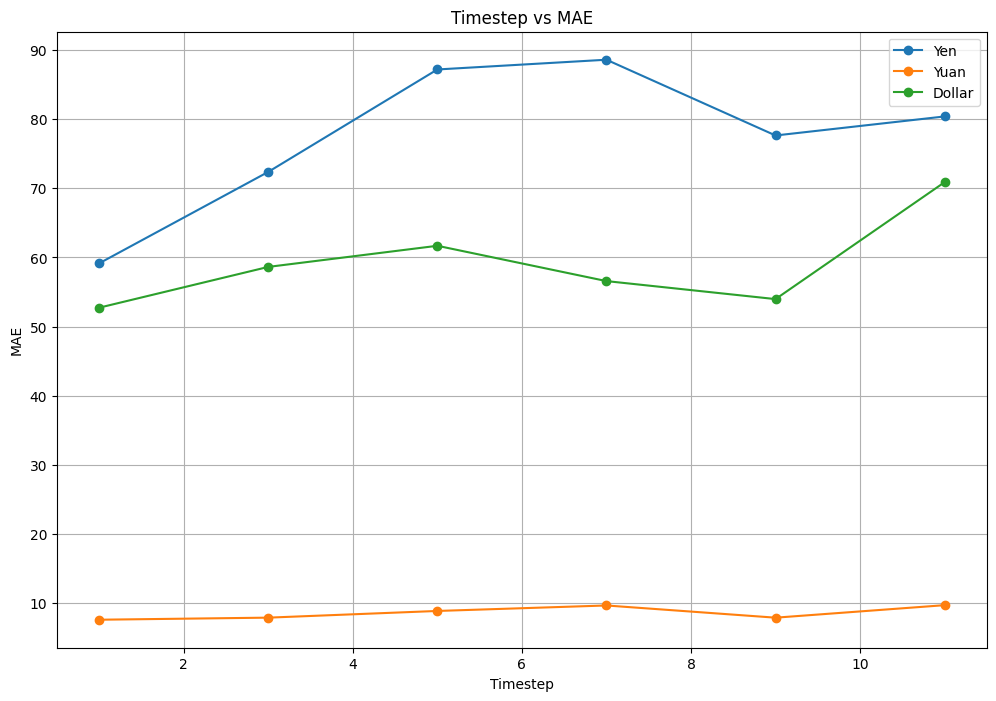

In [ ]:
# Fungsi untuk visualisasi Timestep terhadap MAE untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    datasets = results_df['Dataset'].unique()
    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Fungsi untuk membangun model LSTM
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Membangun dan melatih model LSTM
        model = build_lstm_model((X_train.shape[1], X_train.shape[2]))
        model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

        # Menampilkan beberapa sampel hasil denormalisasi untuk verifikasi
        print(f"\nSample Results for Train Data ({name} with {n_steps} Timestep):")
        print(pd.DataFrame({'Actual': y_train_denorm, 'Predicted': y_pred_train_denorm}).head(10))
        print(f"\nSample Results for Test Data ({name} with {n_steps} Timestep):")
        print(pd.DataFrame({'Actual': y_test_denorm, 'Predicted': y_pred_test_denorm}).head(10))

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

# Fungsi untuk visualisasi Timestep terhadap MAE untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    datasets = results_df['Dataset'].unique()
    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


7/7 [==============================] - 0s 2ms/step


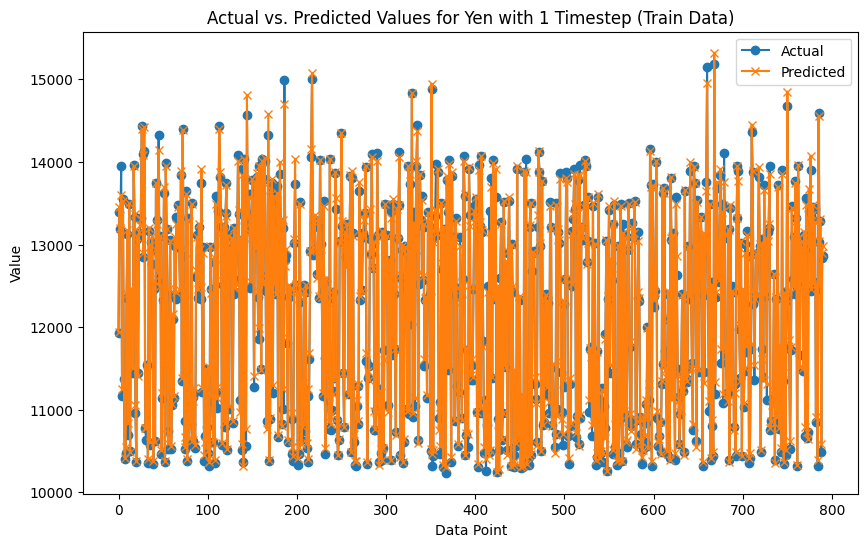

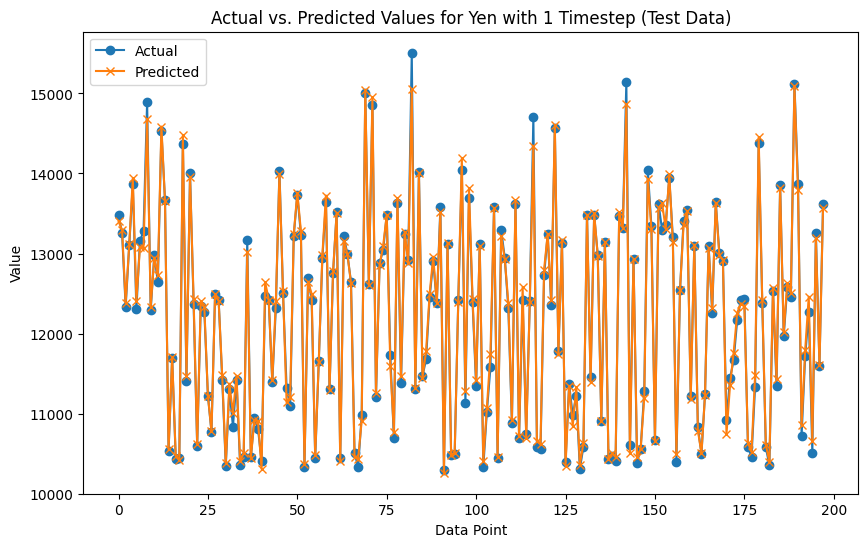

Test results for Yen with 1 timestep saved to Yen_test_results_timestep_1.csv
7/7 [==============================] - 0s 4ms/step


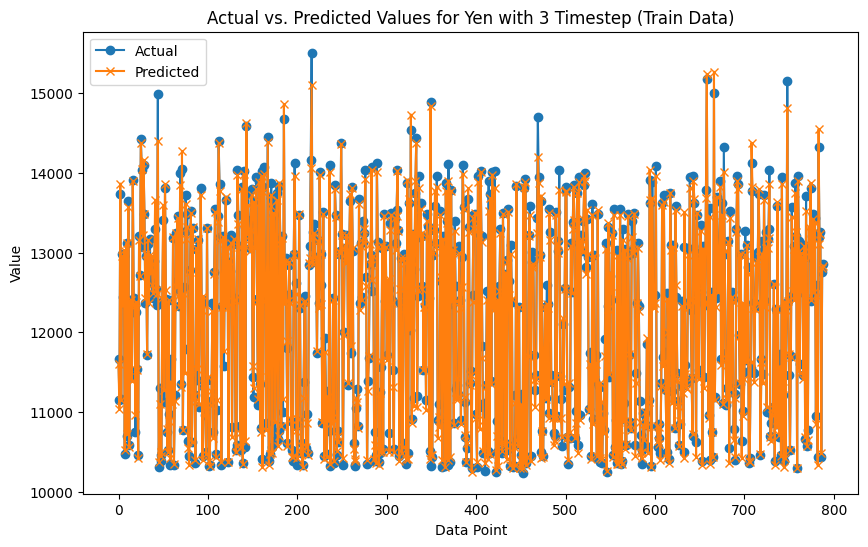

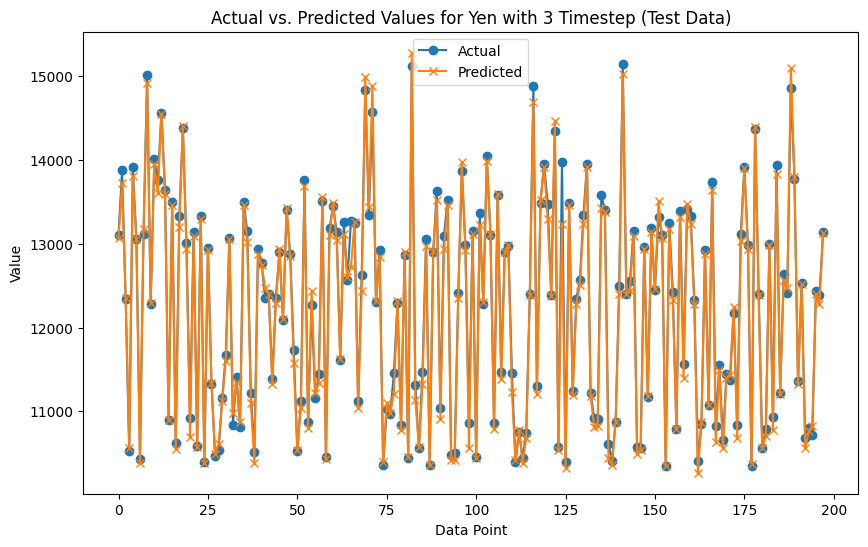

Test results for Yen with 3 timestep saved to Yen_test_results_timestep_3.csv
7/7 [==============================] - 0s 3ms/step


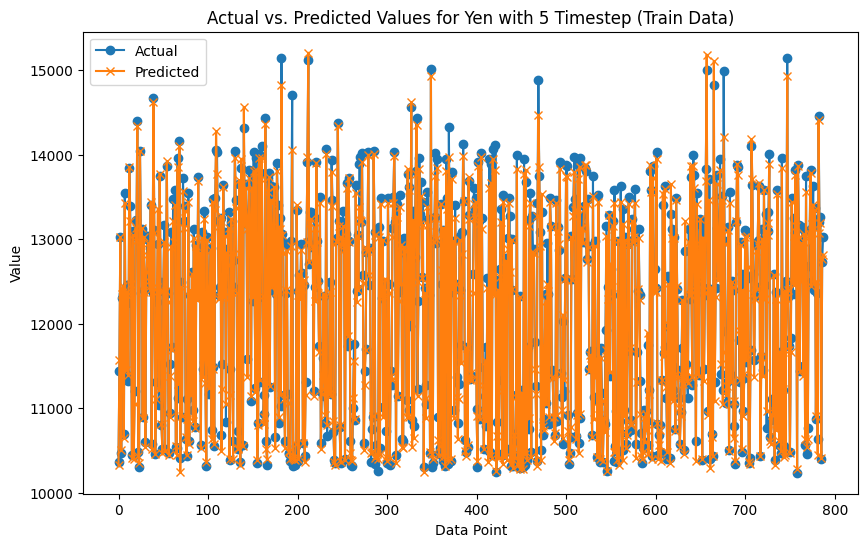

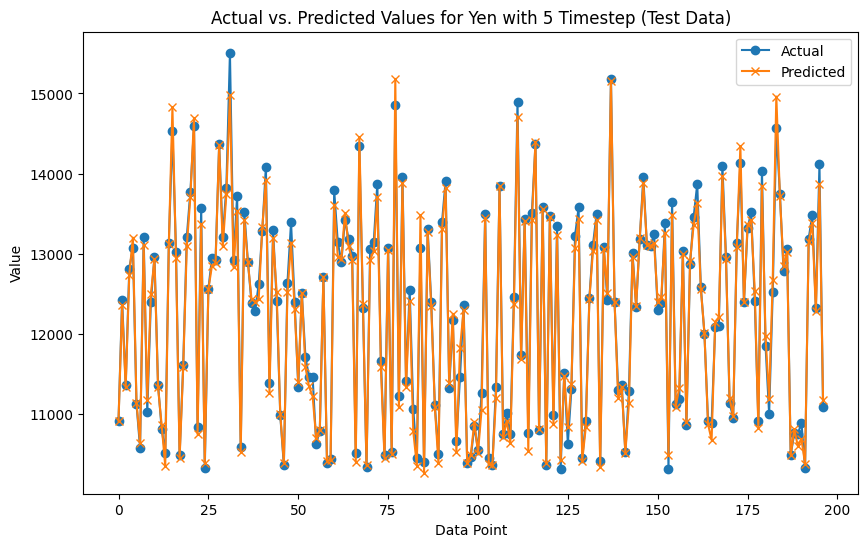

Test results for Yen with 5 timestep saved to Yen_test_results_timestep_5.csv
7/7 [==============================] - 0s 5ms/step


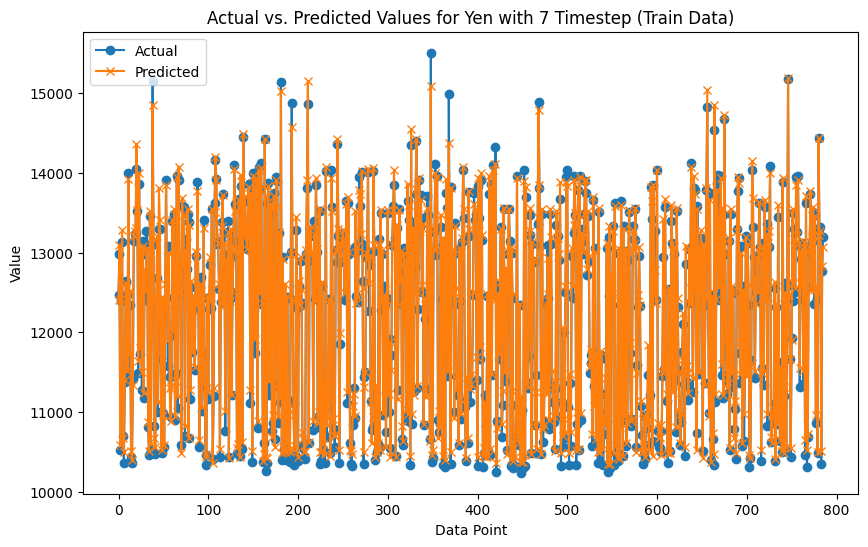

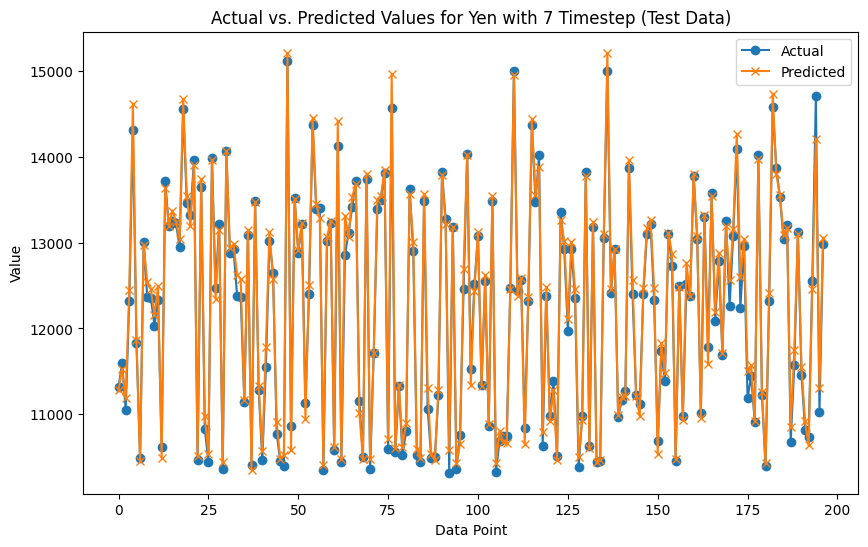

Test results for Yen with 7 timestep saved to Yen_test_results_timestep_7.csv
7/7 [==============================] - 0s 4ms/step


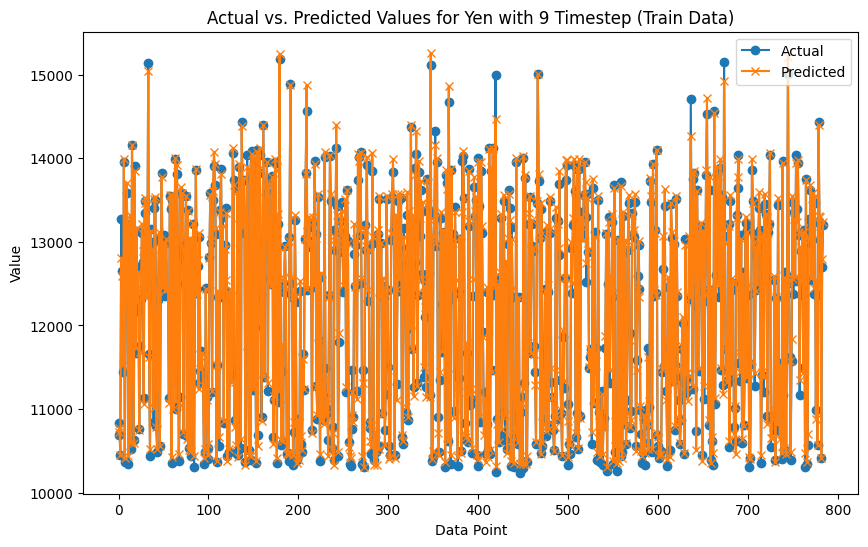

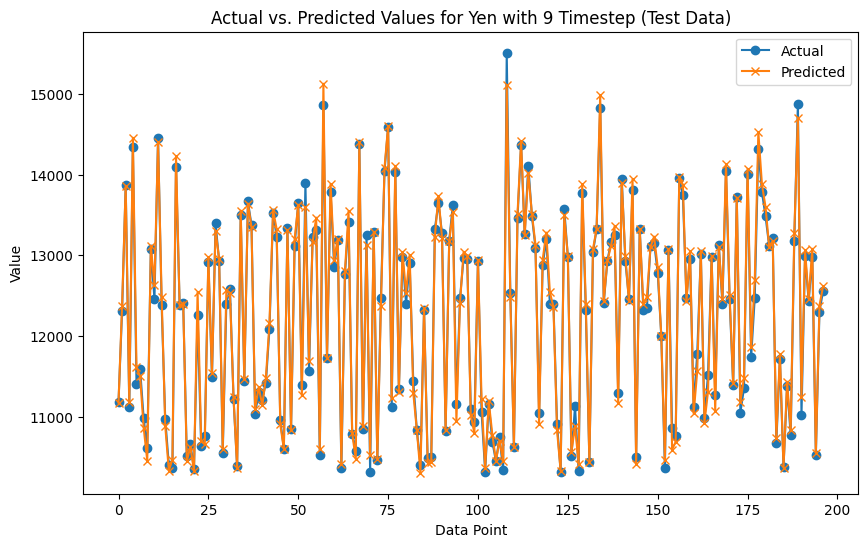

Test results for Yen with 9 timestep saved to Yen_test_results_timestep_9.csv
7/7 [==============================] - 0s 4ms/step


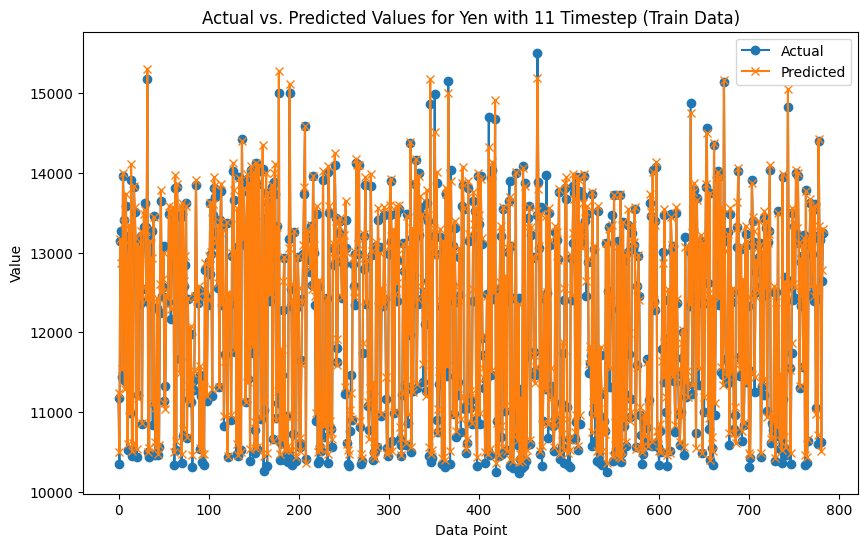

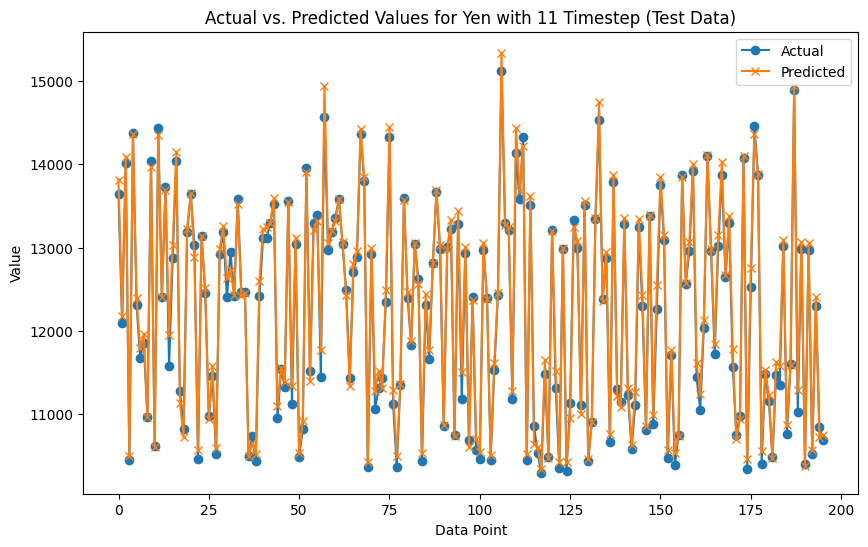

Test results for Yen with 11 timestep saved to Yen_test_results_timestep_11.csv
7/7 [==============================] - 0s 3ms/step


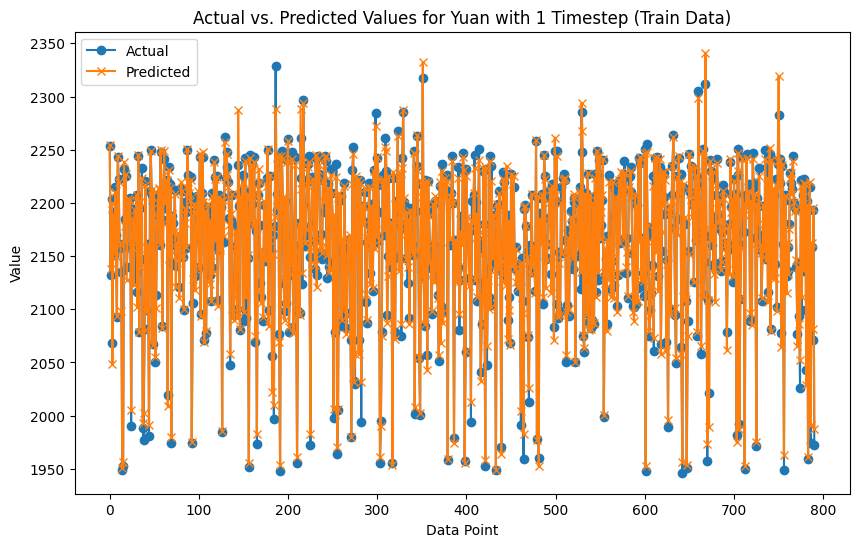

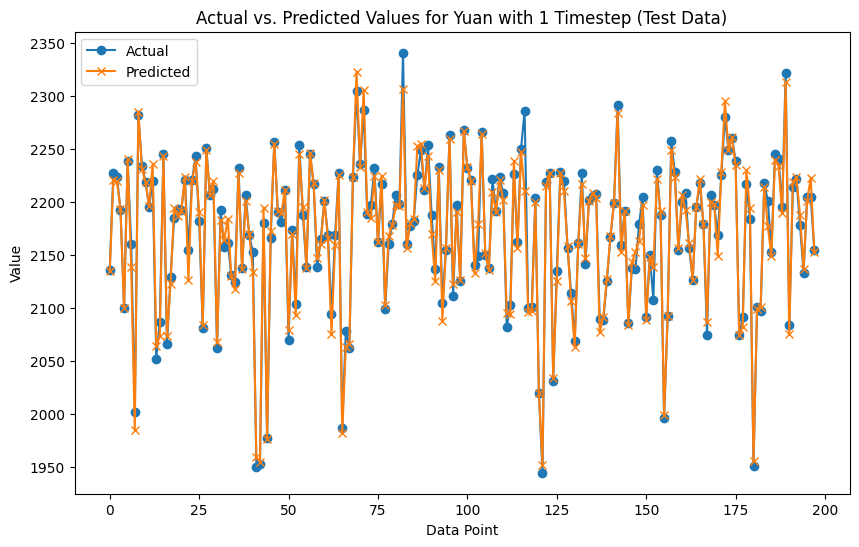

Test results for Yuan with 1 timestep saved to Yuan_test_results_timestep_1.csv
7/7 [==============================] - 0s 4ms/step


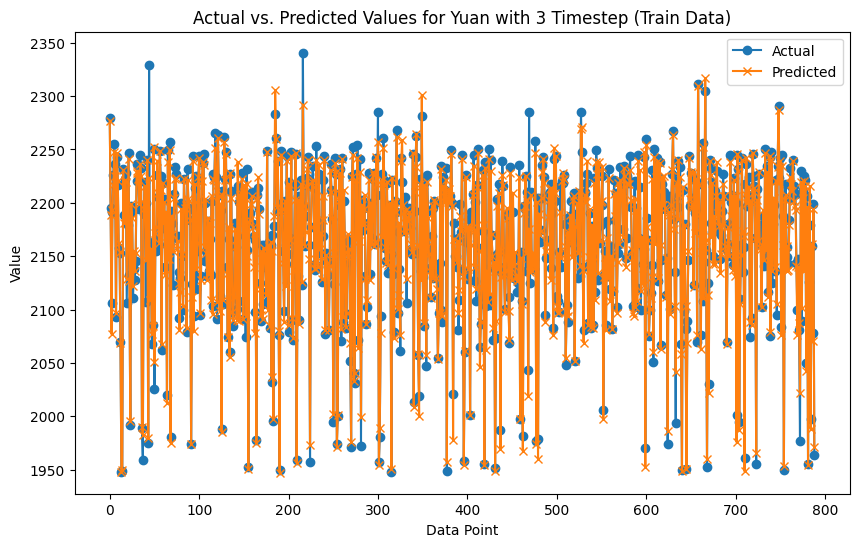

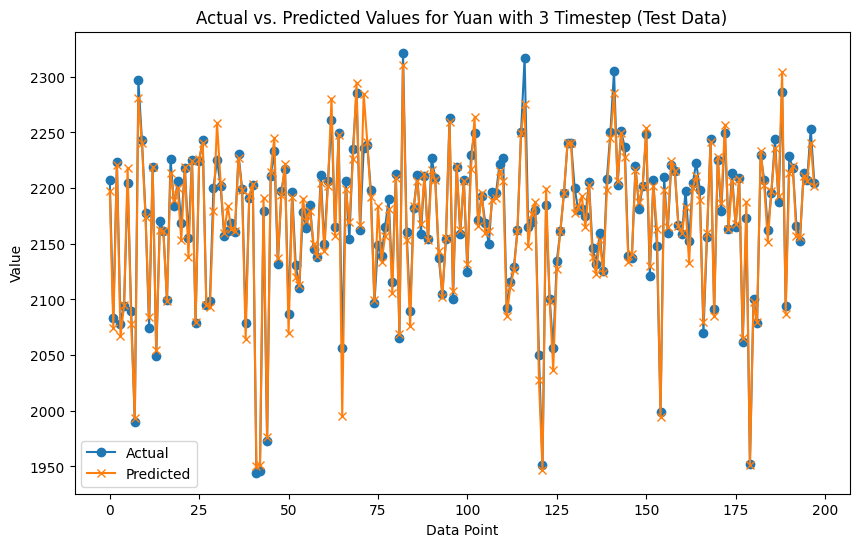

Test results for Yuan with 3 timestep saved to Yuan_test_results_timestep_3.csv
7/7 [==============================] - 0s 4ms/step


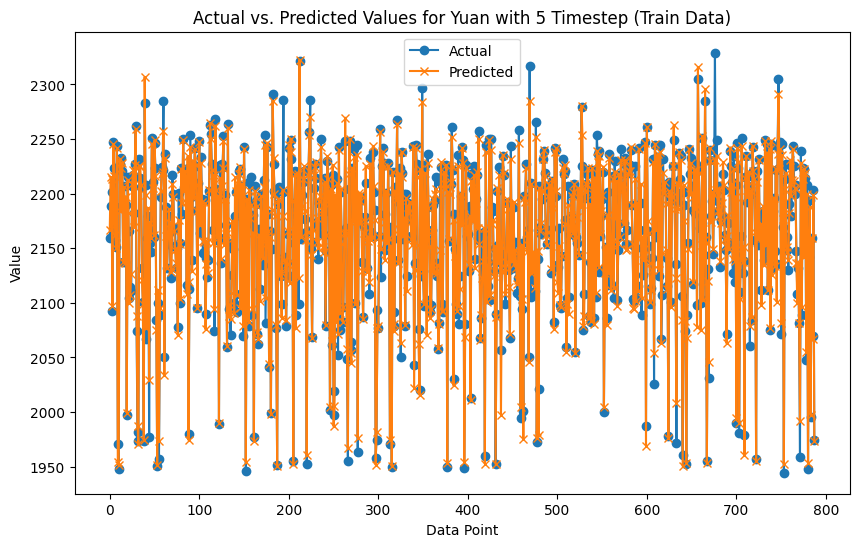

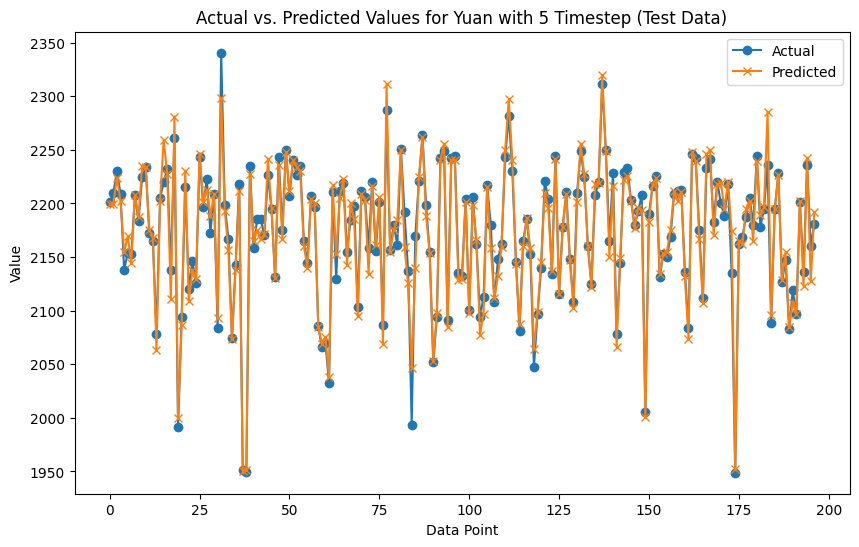

Test results for Yuan with 5 timestep saved to Yuan_test_results_timestep_5.csv
7/7 [==============================] - 0s 3ms/step


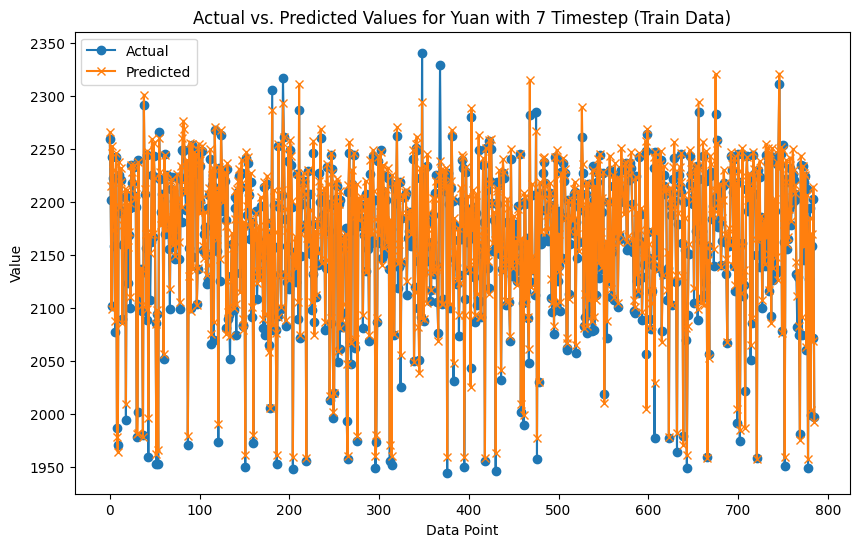

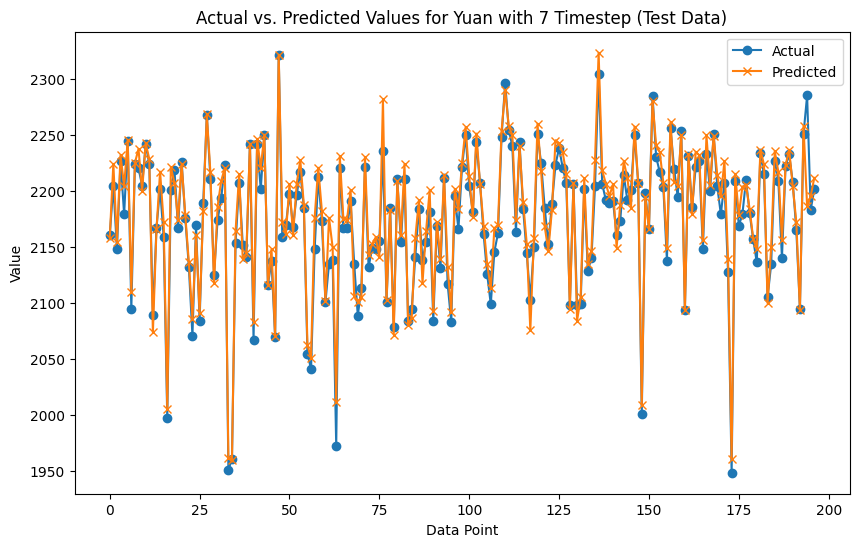

Test results for Yuan with 7 timestep saved to Yuan_test_results_timestep_7.csv
7/7 [==============================] - 0s 6ms/step


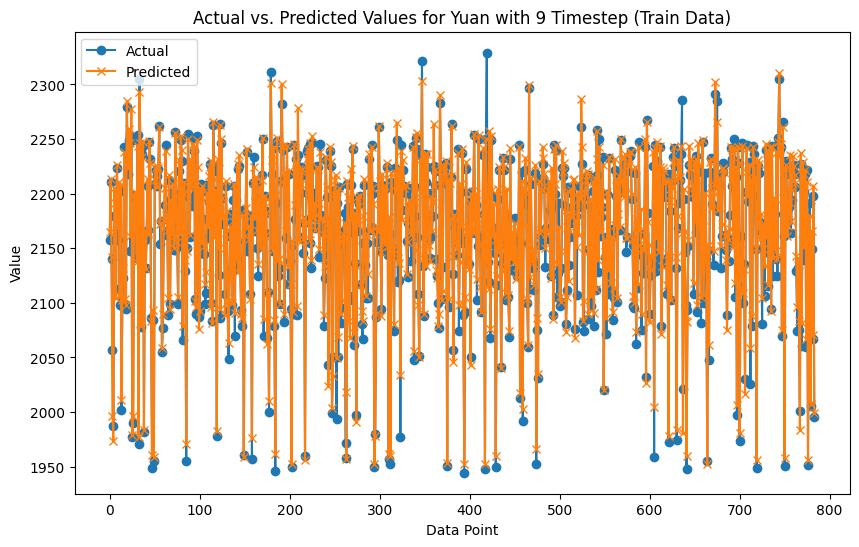

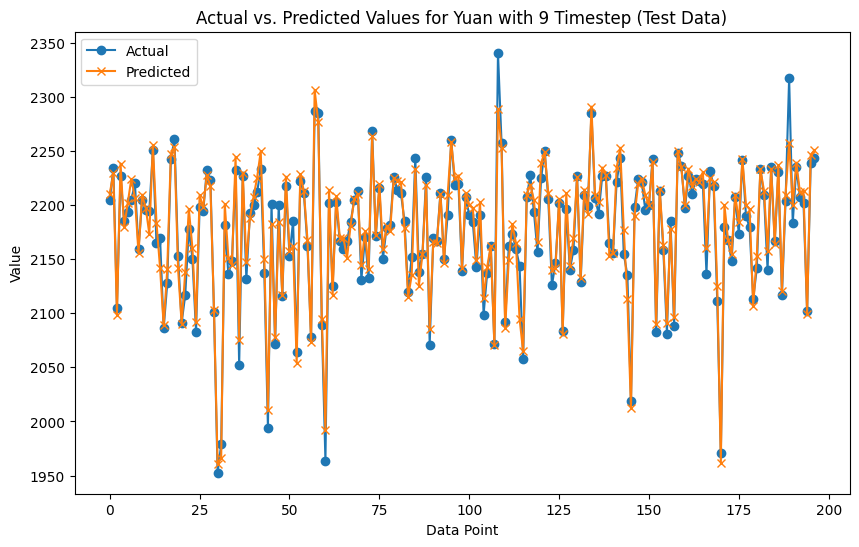

Test results for Yuan with 9 timestep saved to Yuan_test_results_timestep_9.csv
7/7 [==============================] - 0s 6ms/step


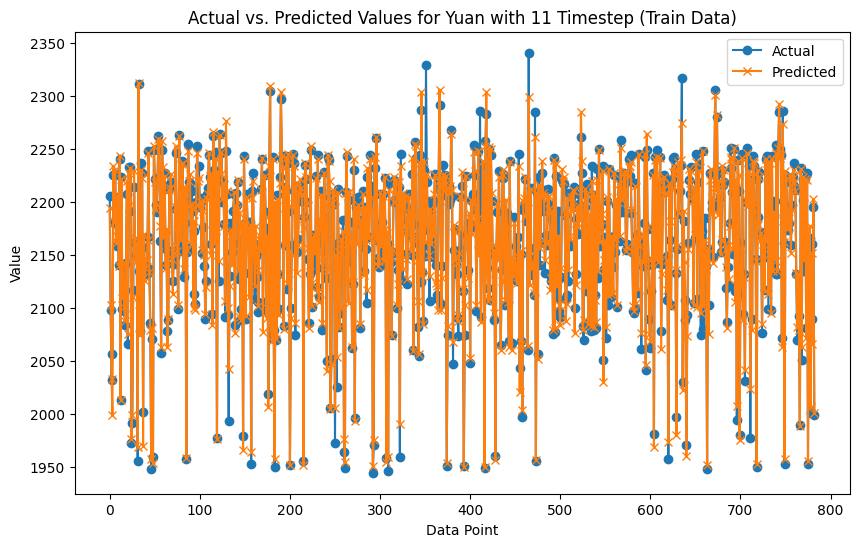

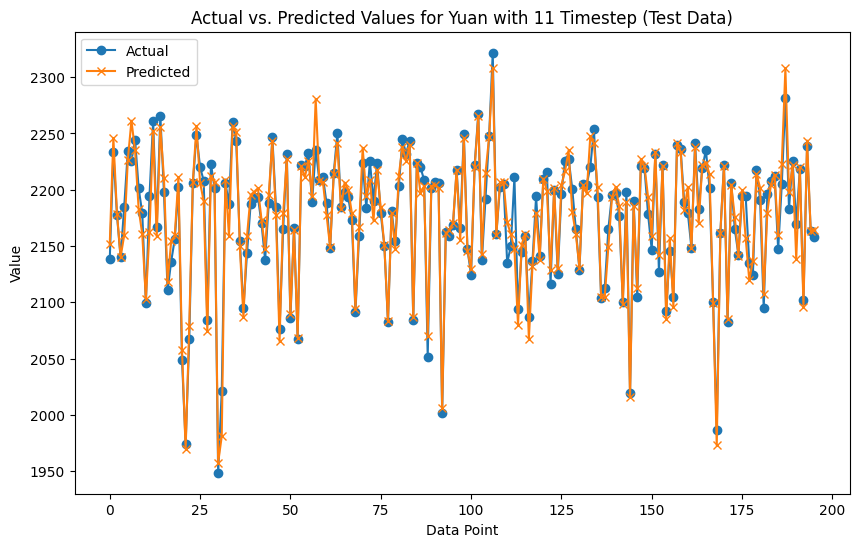

Test results for Yuan with 11 timestep saved to Yuan_test_results_timestep_11.csv
7/7 [==============================] - 0s 5ms/step


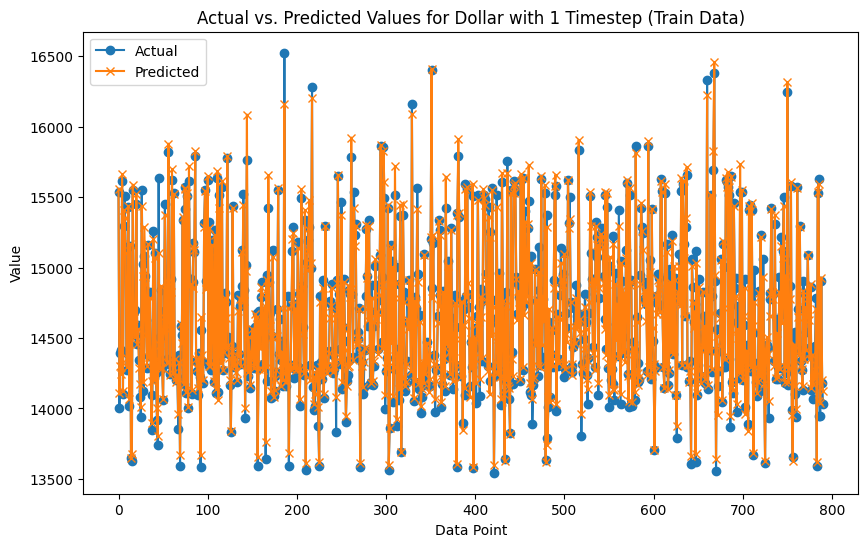

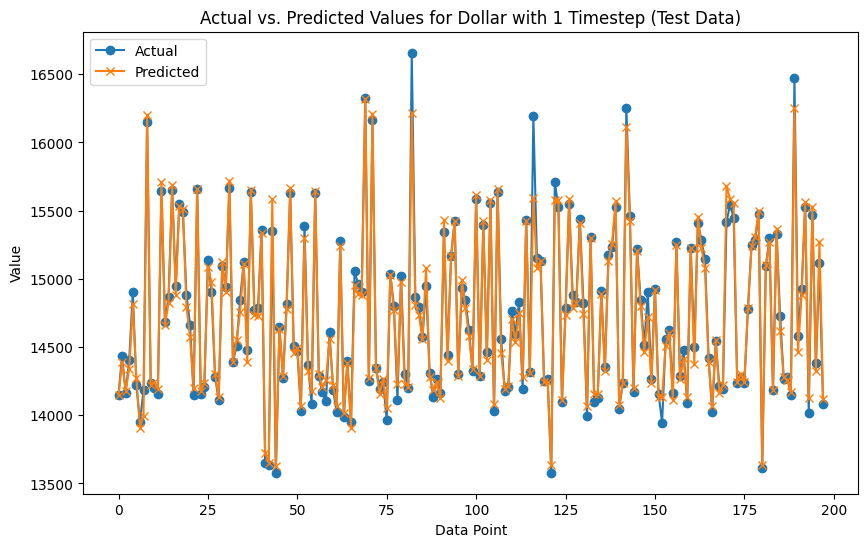

Test results for Dollar with 1 timestep saved to Dollar_test_results_timestep_1.csv
7/7 [==============================] - 0s 4ms/step


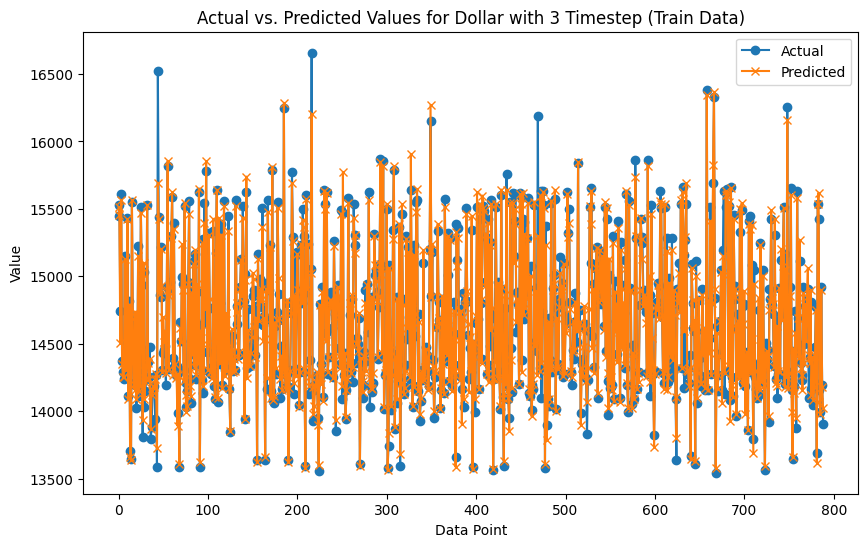

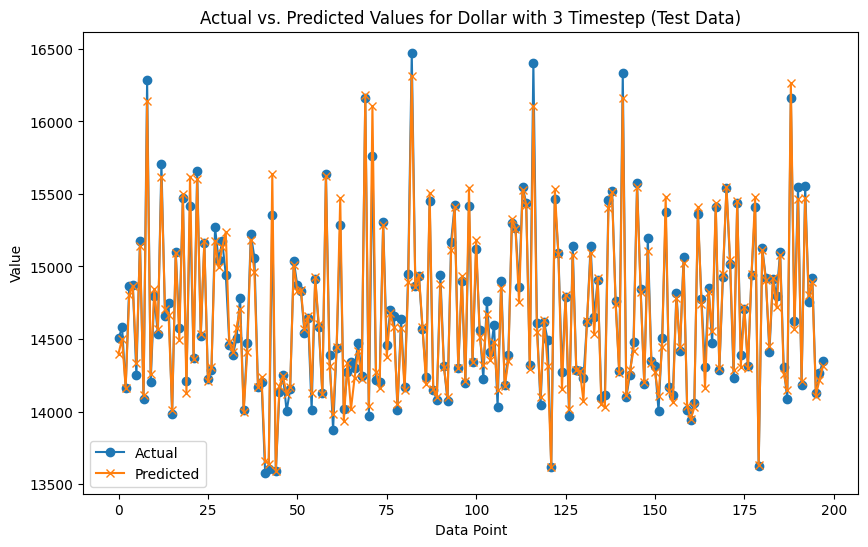

Test results for Dollar with 3 timestep saved to Dollar_test_results_timestep_3.csv
7/7 [==============================] - 0s 3ms/step


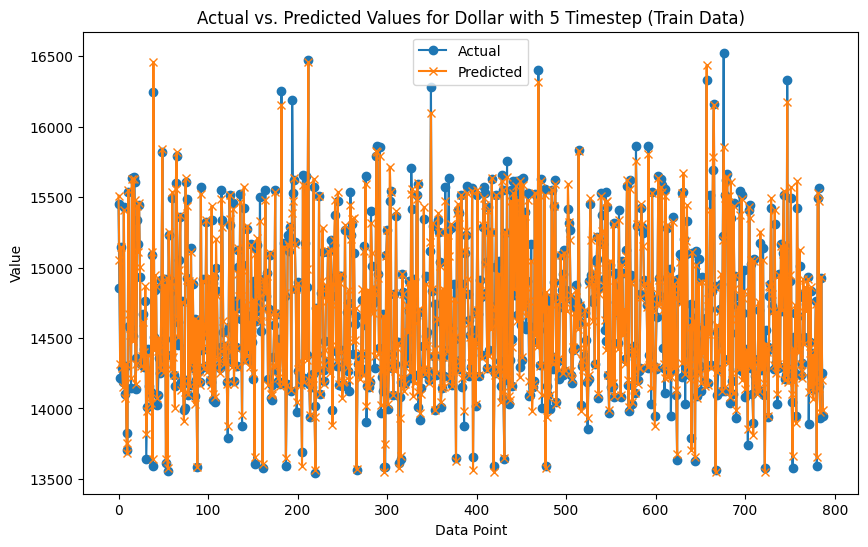

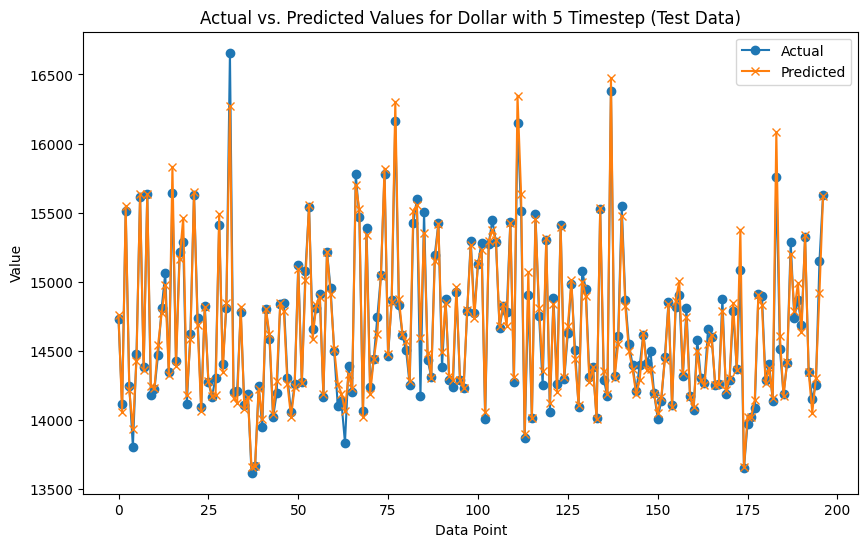

Test results for Dollar with 5 timestep saved to Dollar_test_results_timestep_5.csv
7/7 [==============================] - 0s 4ms/step


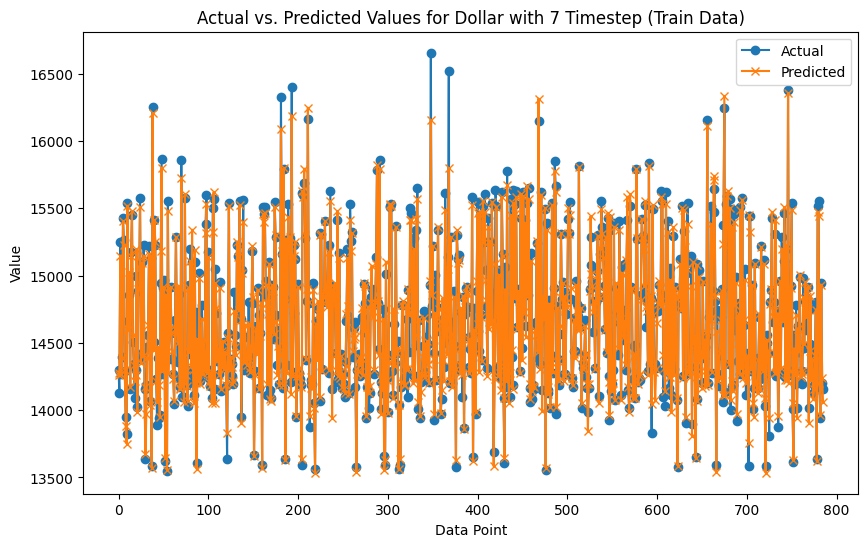

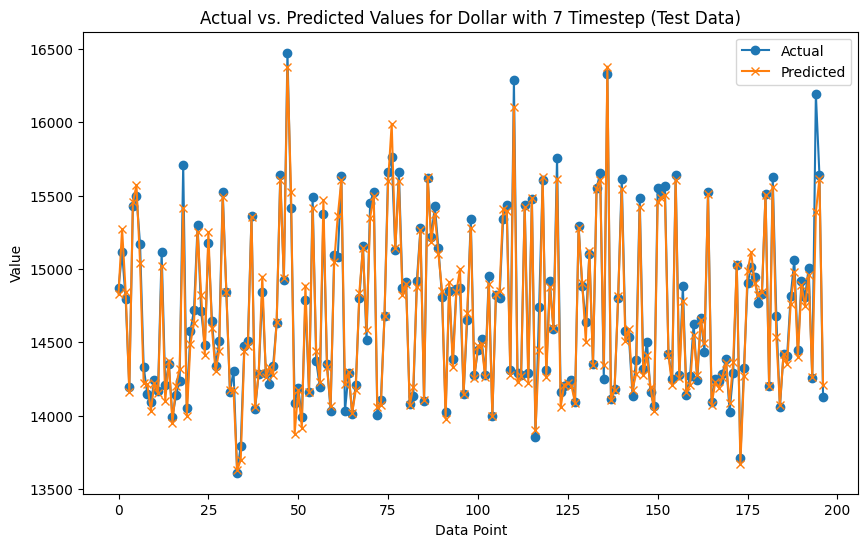

Test results for Dollar with 7 timestep saved to Dollar_test_results_timestep_7.csv
7/7 [==============================] - 0s 5ms/step


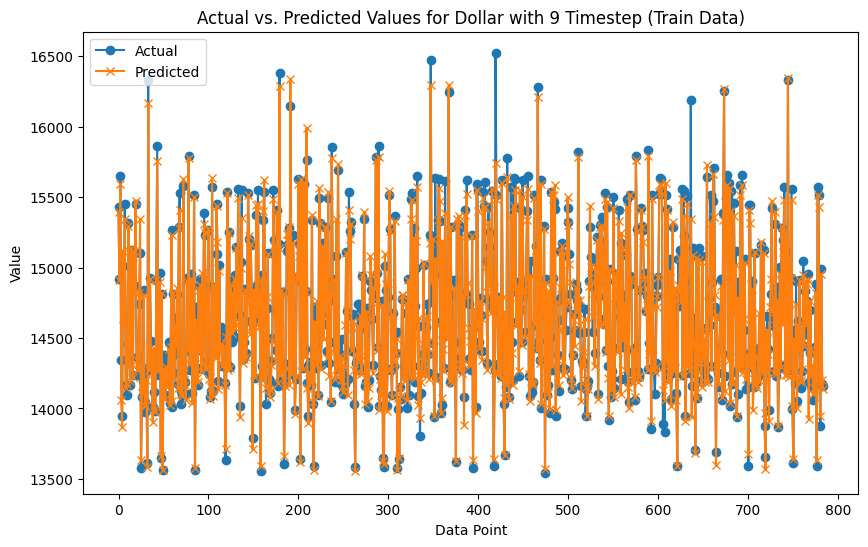

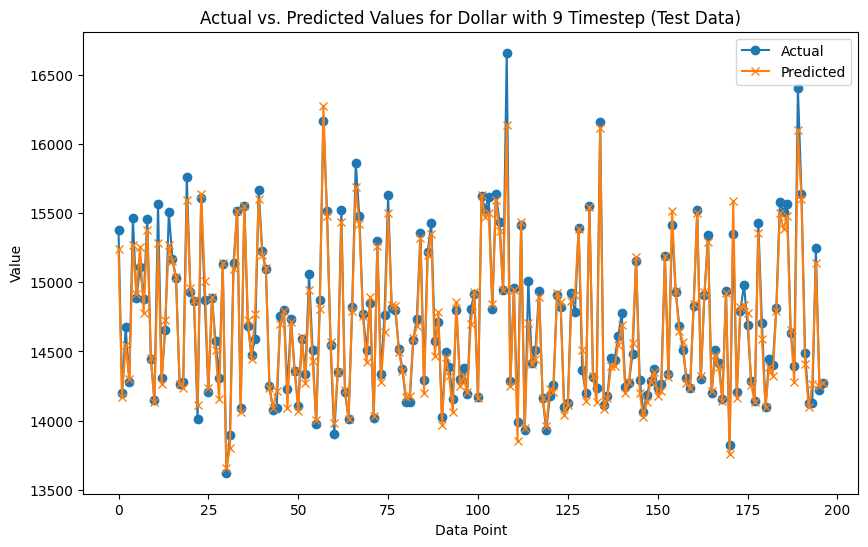

Test results for Dollar with 9 timestep saved to Dollar_test_results_timestep_9.csv
7/7 [==============================] - 0s 5ms/step


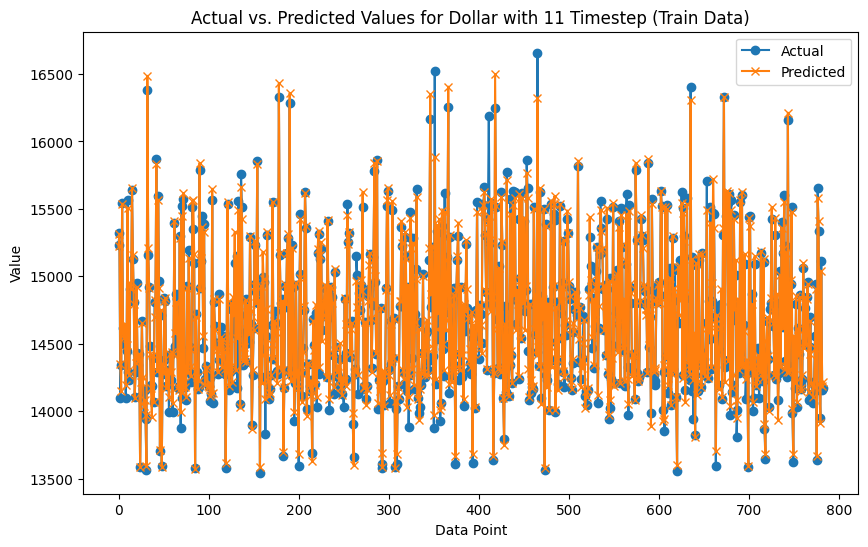

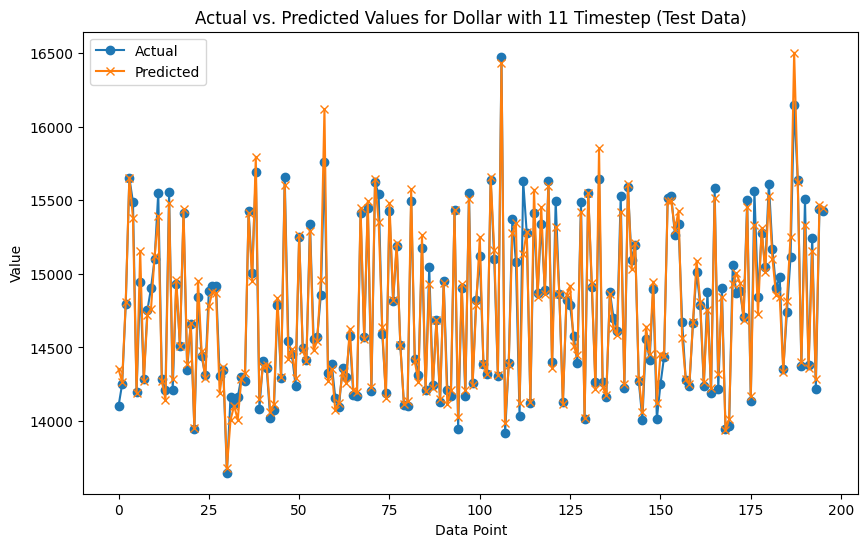

Test results for Dollar with 11 timestep saved to Dollar_test_results_timestep_11.csv
   Dataset  Timestep Data Type        MAE  R-square       Bias      MAPE
0      Yen         1     Train  57.421627  0.995843  15.890823  0.474320
1      Yen         1      Test  60.774355  0.995563  11.419778  0.495913
2      Yen         3     Train  73.908372  0.993426 -33.244569  0.605271
3      Yen         3      Test  75.936352  0.992466 -43.065065  0.616507
4      Yen         5     Train  91.663460  0.989764 -53.360683  0.746786
5      Yen         5      Test  91.555609  0.991133 -31.046105  0.740768
6      Yen         7     Train  91.920130  0.990789  38.968261  0.765162
7      Yen         7      Test  92.919262  0.990706  41.819444  0.765369
8      Yen         9     Train  76.939255  0.993205  23.882755  0.634949
9      Yen         9      Test  77.169789  0.993804  14.788461  0.634183
10     Yen        11     Train  91.663578  0.991313  58.665760  0.764101
11     Yen        11      Test  89.786

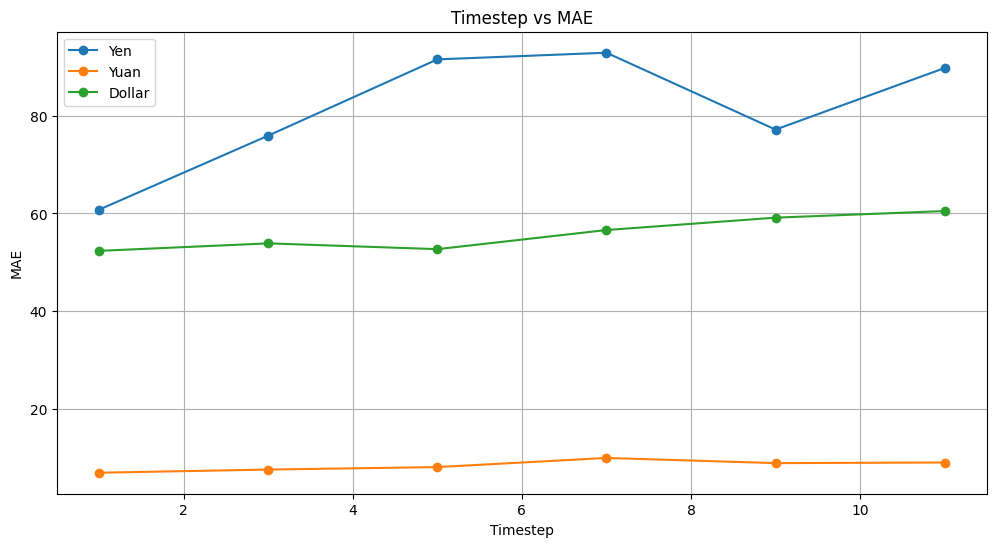

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Fungsi untuk membangun model LSTM
def build_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    df['tanggal'] = pd.to_datetime(df['tanggal'])

    # Pisahkan kolom tanggal
    dates = df['tanggal'].values
    data_numeric = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    # Lakukan scaling hanya pada data numerik
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data_numeric)

    for n_steps in time_steps_options:
        X, y = create_sequences(data_scaled, n_steps, 1)

        X_train, X_test, y_train, y_test, dates_train, dates_test = train_test_split(X, y, dates[n_steps:], test_size=0.2, random_state=42)

        model = build_lstm_model((X_train.shape[1], X_train.shape[2]))
        model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Denormalisasi hasil prediksi dan data aktual
        # Menyusun kembali data yang akan didenormalisasi agar memiliki shape yang sesuai
        y_train_combined = np.concatenate((X_train[:, -1, :-1], y_train), axis=1)
        y_pred_train_combined = np.concatenate((X_train[:, -1, :-1], y_pred_train), axis=1)
        y_test_combined = np.concatenate((X_test[:, -1, :-1], y_test), axis=1)
        y_pred_test_combined = np.concatenate((X_test[:, -1, :-1], y_pred_test), axis=1)

        # Tambahkan kolom dummy
        y_train_combined = np.concatenate([y_train_combined, np.zeros((y_train_combined.shape[0], 1))], axis=1)
        y_pred_train_combined = np.concatenate([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))], axis=1)
        y_test_combined = np.concatenate([y_test_combined, np.zeros((y_test_combined.shape[0], 1))], axis=1)
        y_pred_test_combined = np.concatenate([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))], axis=1)

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

        # Membuat DataFrame untuk data actual dan predicted test dengan tanggal
        test_results_df = pd.DataFrame({
            'Date': dates_test,
            'Actual': y_test_denorm,
            'Predicted': y_pred_test_denorm
        })

        # Simpan DataFrame ke file CSV
        test_results_df.to_csv(f'{name}_test_results_timestep_{n_steps}.csv', index=False)

        print(f"Test results for {name} with {n_steps} timestep saved to {name}_test_results_timestep_{n_steps}.csv")

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

# Plot MAE terhadap timestep untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    plt.figure(figsize=(12, 6))
    for dataset in results_df['Dataset'].unique():
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


<Figure size 1200x600 with 0 Axes>

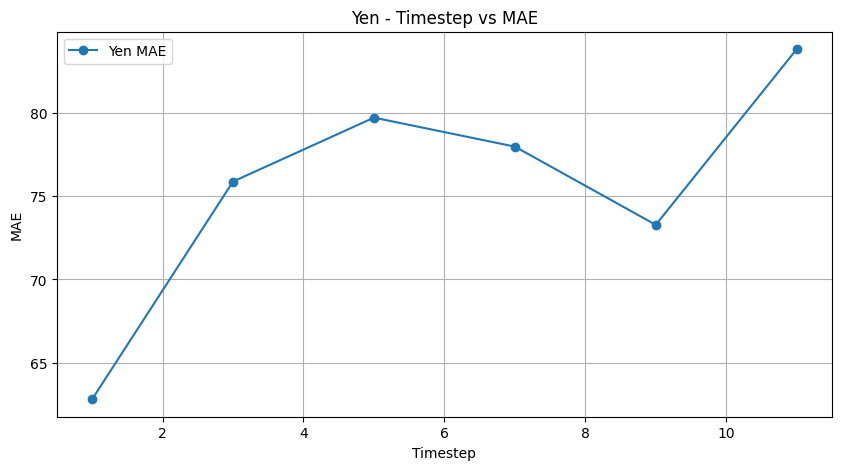

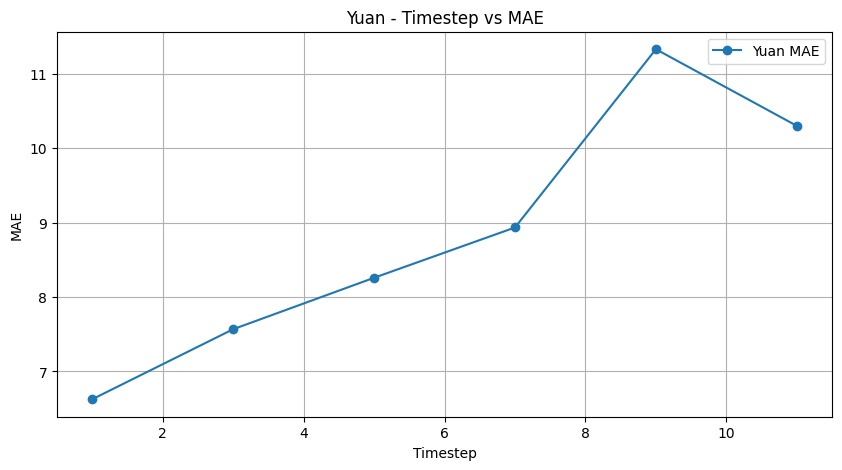

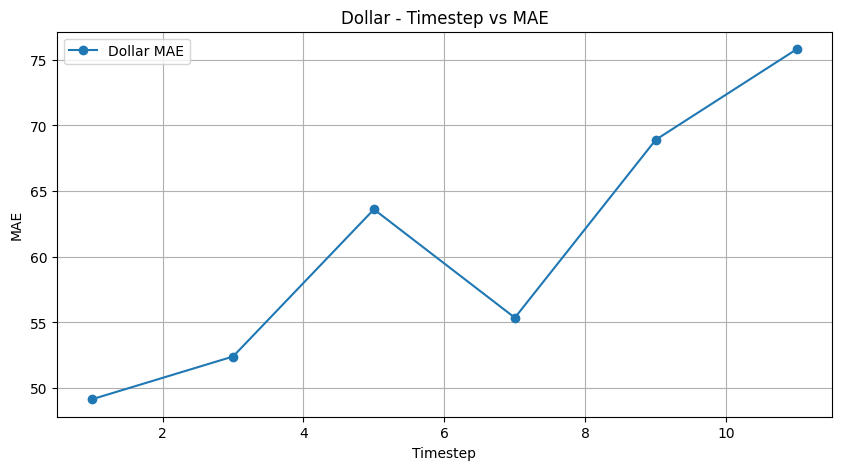

In [ ]:
# Fungsi untuk memplot MAE terhadap timestep untuk setiap dataset secara terpisah
def plot_timestep_vs_metric_separately(results_df, metric):
    plt.figure(figsize=(12, 6))
    for dataset in results_df['Dataset'].unique():
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.figure(figsize=(10, 5))
        plt.plot(data['Timestep'], data[metric], marker='o', label=f'{dataset} {metric}')
        plt.title(f'{dataset} - Timestep vs {metric}')
        plt.xlabel('Timestep')
        plt.ylabel(metric)
        plt.legend()
        plt.grid(True)
        plt.show()

# Plot MAE terhadap timestep untuk setiap dataset secara terpisah
plot_timestep_vs_metric_separately(results_df, 'MAE')
